In [1]:
import pandas as pd

fpath = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/darga_rain_2013_with_discharge_events.parquet"

df_temp = pd.read_parquet(fpath)

# Print column names
print("Columns in df_temp:")
print(df_temp.columns)

# Print first few rows
print("\nSample rows (head):")
print(df_temp.head())

# Or get summary info
print("\nDataFrame info:")
df_temp.info()

Columns in df_temp:
Index(['ID', 'time', 'rainrate', 'latitude', 'longitude', 'AREA_2M',
       'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI',
       'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'EQUATION', 'D50MM',
       'manning_n', 'rg_qms'],
      dtype='object')

Sample rows (head):
   ID                time  rainrate   latitude  longitude  AREA_2M  \
0   1 2013-01-06 22:30:00  0.001657  31.580134  35.266465   260847   
1   2 2013-01-06 22:30:00  0.112328  31.600390  35.227964  1510689   
2   3 2013-01-06 22:30:00  0.027592  31.588026  35.237338    39704   
3   4 2013-01-06 22:30:00  0.003280  31.588228  35.250409     6199   
4   5 2013-01-06 22:30:00  0.022023  31.591590  35.237395   565912   

   STRM_ORDER  STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  \
0           3            1  509.220426  15.650532  ...  0.000826  0.881682   
1           3            0  722.415574  10.963549  ...  0.000169  0.605801   
2           3            0  636

In [2]:
#time normalization

import os
import pandas as pd

# Adjust these according to your setup
DATA_DIR = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based"

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

# If you want to overwrite the original files, set this to DATA_DIR
# but it's often safer to write to a new directory to avoid overwriting
OUT_DIR = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED"

os.makedirs(OUT_DIR, exist_ok=True)

all_files = TRAIN_FILES + TEST_FILES

###############################################################################
# 1) Find global minimum time across ALL files
###############################################################################
all_mins = []
for fname in all_files:
    fpath = os.path.join(DATA_DIR, fname)
    df = pd.read_parquet(fpath)
    # Append earliest datetime in this file
    all_mins.append(df["time"].min())

# Compute the earliest time across all files
global_min_time = min(all_mins)
print(f"Global earliest time across all files: {global_min_time}")

###############################################################################
# 2) Convert 'time' -> numeric 'tau' for each file, save to out_dir
###############################################################################
for fname in all_files:
    fpath = os.path.join(DATA_DIR, fname)
    df = pd.read_parquet(fpath)

    # Convert from datetime to seconds from global_min_time
    df["tau"] = (df["time"] - global_min_time).dt.total_seconds()

    # If you do NOT need the original 'time' column anymore, you can drop it:
    # df.drop(columns="time", inplace=True)

    # Otherwise, you could just keep it or rename it if needed

    # Save to new Parquet (you can overwrite or create a new version)
    out_path = os.path.join(OUT_DIR, fname)
    df.to_parquet(out_path, index=False)
    print(f"Saved normalized time to {out_path}")


Global earliest time across all files: 2013-01-06 22:30:00
Saved normalized time to /home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED/darga_rain_2013_with_discharge_events.parquet
Saved normalized time to /home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED/darga_rain_2014_with_discharge_events.parquet
Saved normalized time to /home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED/darga_rain_2015_with_discharge_events.parquet
Saved normalized time to /home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED/darga_rain_2016_wit

In [ ]:
#FIRST RUN - using the fetures like the POC (elevation, rain and discharge) (just higher resolution)

Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs ===
Epoch [1/120] - DataLoss: 0.4996, PhysLoss: 0.0009
Epoch [2/120] - DataLoss: 0.4685, PhysLoss: 0.0024
Epoch [3/120] - DataLoss: 0.4661, PhysLoss: 0.0028
Epoch [4/120] - DataLoss: 0.4652, PhysLoss: 0.0028
Epoch [5/120] - DataLoss: 0.4646, PhysLoss: 0.0028
Epoch [6/120] - DataLoss: 0.4642, PhysLoss: 0.0028
Epoch [7/120] - DataLoss: 0.4636, PhysLoss: 0.0028
Epoch [8/120] - DataLoss: 0.4632, PhysLoss: 0.0028
Epoch [9/120] - DataLoss: 0.4631, PhysLoss: 0.0028
Epoch [10/120] - DataLoss: 0.4626, PhysLoss: 0.0028
Epoch [11/120] - DataLoss: 0.4624, PhysLoss: 0.0028
Epoch [12/120] - DataLoss: 0.4622, PhysLoss: 0.0028
Epoch [13/120] - DataLoss: 0.4618, PhysLoss: 0.0028
Epoch [14/120] - DataLoss: 0.4619, PhysLoss: 0.0028
Epoch [15/120] - DataLoss: 0.4617, PhysLoss: 0.0028
Epoch [16/120] - DataLoss: 0.4612, PhysLoss: 0.0028
Epoch [17/120] - DataLoss: 0.4612, 

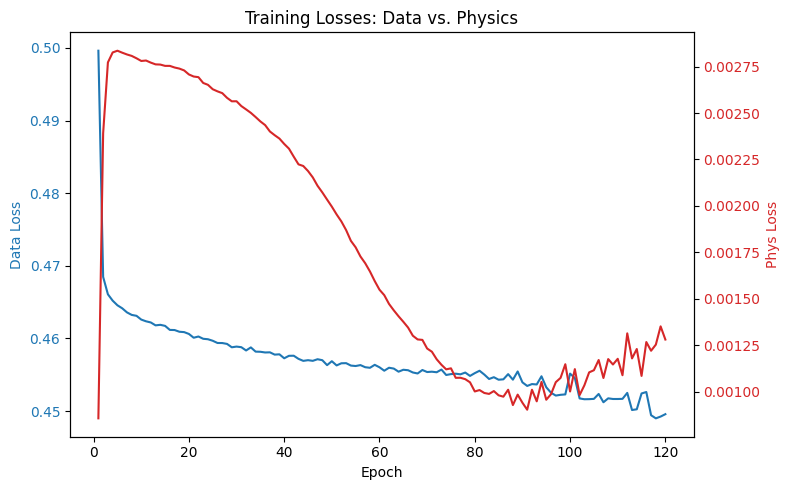

[Matplotlib] Overall MSE: 1.7382


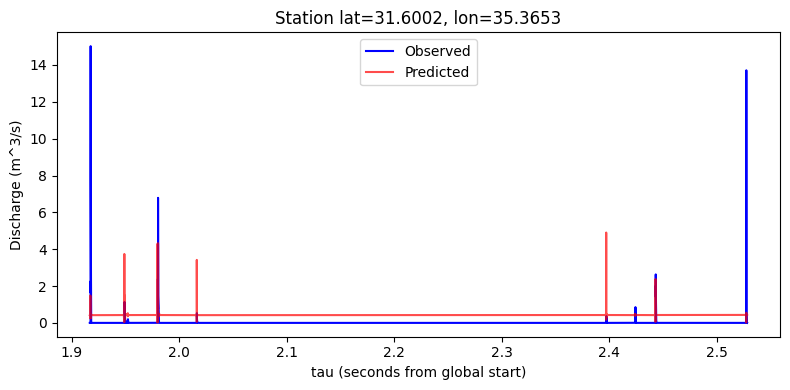

[Plotly] Overall MSE: 1.7382


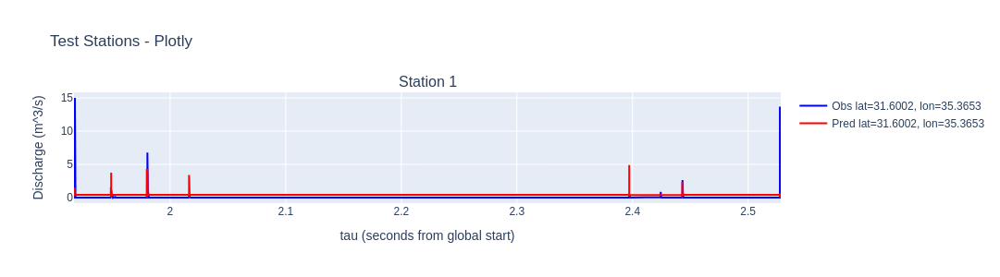

In [3]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/" \
           "full POC model/3 final files according to spatial PINN Hebrew/" \
           "dem slope UGRID/FINAL/event_based/TIME_NORMALIZED"

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    1) Filter out invalid discharge (rg_qms NaN).
    2) Sort by 'tau' if not already sorted.
    """
    # Only keep rows with a valid discharge
    df = df[~df["rg_qms"].isna()].copy()
    
    # Sort by numeric tau
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Normalizing Features
###############################################################################
# We'll use DEM instead of 'elevation', SLOPE instead of 'slope_calculated'.
FEATURE_COLS = ["rainrate", "DEM", "SLOPE", "tau"]

def fit_scaler(df_train):
    scaler = StandardScaler()
    scaler.fit(df_train[FEATURE_COLS])
    return scaler

def apply_scaler(df, scaler):
    df[FEATURE_COLS] = scaler.transform(df[FEATURE_COLS])
    return df

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, seq_len=6):
    """
    Convert a time-ordered DataFrame into LSTM sequences.
    We'll return:
      X_all:  (N-seq_len, seq_len, num_features)
      y_all:  (N-seq_len, 1)       # log discharge
      tau_all, lat_all, lon_all:   (N-seq_len, 1)
    """
    feats = df[FEATURE_COLS].values.astype(np.float32)

    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1 + q)

    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    
    N = len(df)
    for i in range(N - seq_len):
        X_list.append(feats[i : i + seq_len])     # input sequence
        y_list.append(log_q[i + seq_len])         # target is log discharge at step i+seq_len
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1, 1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1, 1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1, 1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1, 1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model Definition: LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    We'll interpret the feature columns as:
      - index 0 -> rain
      - index 1 -> DEM
      - index 2 -> SLOPE
      - index 3 -> tau
    infiltration = ReLU(i0 + iDEM * DEM + iSlope * SLOPE)
    """
    def __init__(self, input_size=4, hidden_size=128, num_layers=2, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size, hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # PDE infiltration parameters
        self.alpha  = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0     = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM   = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]  # get the last time-step
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, dem, slope):
        # infiltration = ReLU(i0 + iDEM*dem + iSlope*slope)
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    # Weighted MSE to emphasize big flows
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true) ** 2
    return torch.mean(w * diff)

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=120, lambda_data=1.0, lambda_phys=0.8,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration constraint
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            # roll through LSTM to get Q_t for each step
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])  # logQ
                Q_t = torch.expm1(log_q_t)  # actual discharge
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len - 1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx + 1]
                
                rain_t  = X_batch[:, t_idx, 0].unsqueeze(1)  # "rainrate"
                dem_t   = X_batch[:, t_idx, 1].unsqueeze(1)  # "DEM"
                slope_t = X_batch[:, t_idx, 2].unsqueeze(1)  # "SLOPE"
                
                infil_val = model.infiltration_fn(dem_t, slope_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                # PDE: Q_{t+1} - Q_t = alpha * (rain - infiltration)
                diff = Q_t1 - Q_t - alpha * eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len - 1)
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data,1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label='Observed', color='blue')
        plt.plot(tau_st, pred_st, label='Predicted', color='red', alpha=0.7)
        plt.xlabel("tau (seconds from global start)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly"):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds from global start)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 10. Main
###############################################################################
def main():
    # 1) Load Training Data
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # 2) Load Testing Data
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # 3) Fit & Apply Scaler
    scaler = fit_scaler(df_train)
    df_train = apply_scaler(df_train, scaler)
    df_test  = apply_scaler(df_test,  scaler)
    
    # 4) Make Sequences
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, seq_len=seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  seq_len=seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    
    # 5) Model
    model = LSTMInfiltrationReLU(
        input_size=len(FEATURE_COLS),
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 6) Train
    print(f"\n=== Training for {EPOCHS} epochs ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 7) Plot Training Curves
    plot_training_losses(data_losses, phys_losses)
    
    # 8) Evaluate on Test Set
    evaluate_per_station_matplotlib(model, test_loader)
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly")

if __name__ == "__main__":
    main()


In [5]:
#SECOND RUN - using the spatial features

Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['ID', 'rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 19 input features ===
Epoch [1/120] - DataLoss: 0.5182, PhysLoss: 0.0018
Epoch [2/120] - DataLoss: 0.4722, PhysLoss: 0.0052
Epoch [3/120] - DataLoss: 0.4701, PhysLoss: 0.0055
Epoch [4/120] - DataLoss: 0.4689, PhysLoss: 0.0054
Epoch [5/120] - DataLoss: 0.4680, PhysLoss: 0.0054
Epoch [6/120] - DataLoss: 0.4671, PhysLoss: 0.0054
Epoch [7/120] - DataLoss: 0.4666, PhysLoss: 0.0054
Epoch [8/120] - DataLoss: 0.4665, PhysLoss: 0.0053
Epoch [9/120] - DataLoss: 0.4657, PhysLoss: 0.0053
Epoch [10/120] - DataLoss: 0.4656, PhysLoss: 0.0053
Epoch [11/120] - DataLoss: 0.4653, PhysLoss: 0.0052
Epoch [12/120] - DataLoss: 0.4650, PhysLoss: 0

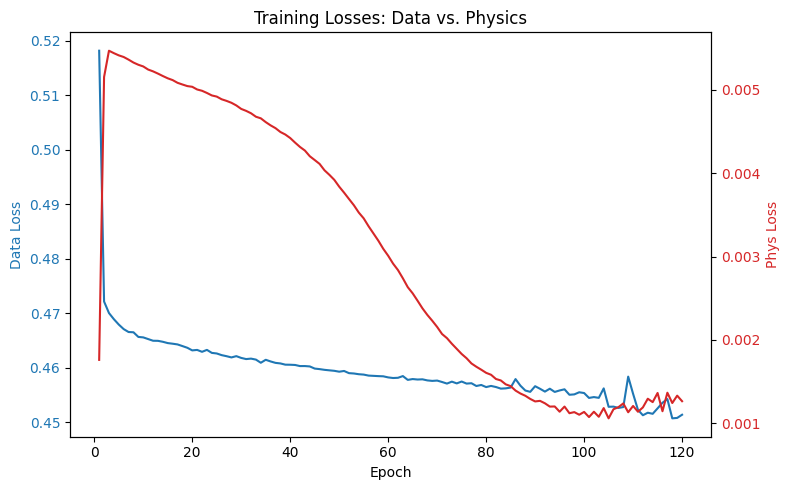

[Matplotlib] Overall MSE: 1.7182


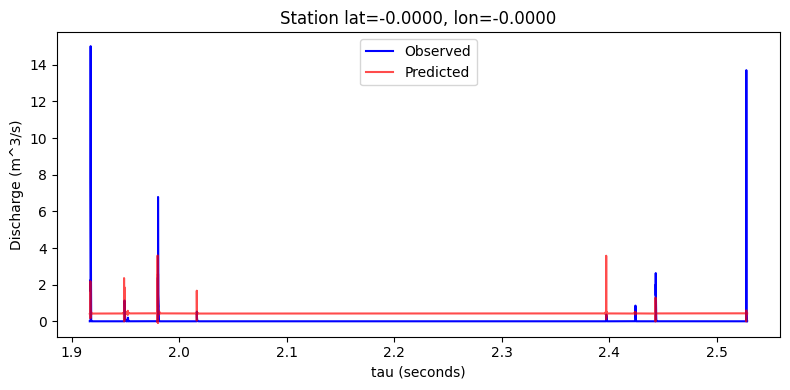

[Plotly] Overall MSE: 1.7182


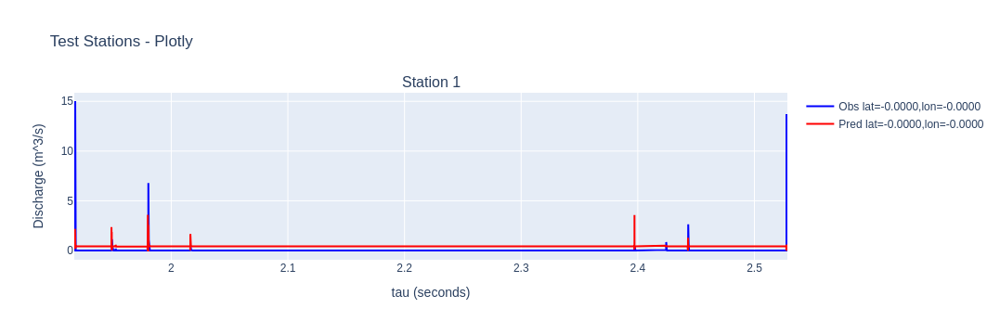

In [6]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

# For plotting
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
# Update this path to your actual folder containing the .parquet files
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    Filter out invalid discharge (rg_qms is NaN),
    then sort by numeric 'tau'.
    """
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    """
    Return all columns EXCEPT:
      - 'EQUATION'  (ignored by request)
      - 'rg_qms'    (this is the target)
      - 'time'      (we have 'tau' instead)
      - optional: 'ID', if it's not useful as a feature
    """
    exclude_cols = {"EQUATION", "rg_qms", "time"}
    # If you don't want ID or other columns, exclude them too:
    # exclude_cols.add("ID")
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    """
    Convert DataFrame to sequences using 'feature_cols'.
    The target is log(rg_qms).
    """
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    We pass all features to LSTM. For infiltration PDE, we specifically need:
      - 'rainrate' index
      - 'DEM' (or elevation) index
      - 'SLOPE' index
    so we can compute infiltration = ReLU(...).
    """
    def __init__(
        self,
        input_size,
        rain_idx,
        dem_idx,
        slope_idx,
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # PDE infiltration parameters
        self.alpha   = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0      = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM    = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        self.relu = nn.ReLU()
        
        # Store indices for PDE
        self.rain_idx  = rain_idx
        self.dem_idx   = dem_idx
        self.slope_idx = slope_idx
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]  # last time-step
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, dem, slope):
        """
        infiltration = ReLU( i0 + iDEM*dem + iSlope*slope )
        """
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=120, lambda_data=1.0, lambda_phys=0.8,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration constraint
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            # 1) Roll through LSTM to get Q_t
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape: (batch,1,features)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)  # actual discharge
                Q_preds.append(Q_t)
            
            # 2) PDE penalty
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len - 1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx + 1]
                
                # parse infiltration columns
                rain_t  = X_batch[:, t_idx, model.rain_idx].unsqueeze(1)
                dem_t   = X_batch[:, t_idx, model.dem_idx].unsqueeze(1)
                slope_t = X_batch[:, t_idx, model.slope_idx].unsqueeze(1)
                
                infil_val = model.infiltration_fn(dem_t, slope_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha * eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len - 1)
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly"):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 10. Main
###############################################################################
def main():
    # 1) Load Training Data
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # 2) Load Test Data
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # 3) Build feature_cols from df_train
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # 4) Fit & Apply Scaler
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # 5) Convert to sequences
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # 6) Indices for PDE infiltration
    # Adjust names if your columns differ
    rain_idx  = feature_cols.index("rainrate")   # or "darga_rain" if needed
    dem_idx   = feature_cols.index("DEM")
    slope_idx = feature_cols.index("SLOPE")
    
    # 7) Instantiate Model
    model = LSTMInfiltrationReLU(
        input_size=num_features,
        rain_idx=rain_idx,
        dem_idx=dem_idx,
        slope_idx=slope_idx,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 8) Train
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 9) Plot
    plot_training_losses(data_losses, phys_losses)
    
    # 10) Evaluate on Test
    evaluate_per_station_matplotlib(model, test_loader)
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly")

if __name__ == "__main__":
    main()


Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 18 input features ===
Epoch [1/120] - DataLoss: 0.5053, PhysLoss: 0.0013
Epoch [2/120] - DataLoss: 0.4705, PhysLoss: 0.0036
Epoch [3/120] - DataLoss: 0.4680, PhysLoss: 0.0039
Epoch [4/120] - DataLoss: 0.4670, PhysLoss: 0.0040
Epoch [5/120] - DataLoss: 0.4659, PhysLoss: 0.0040
Epoch [6/120] - DataLoss: 0.4654, PhysLoss: 0.0040
Epoch [7/120] - DataLoss: 0.4650, PhysLoss: 0.0039
Epoch [8/120] - DataLoss: 0.4645, PhysLoss: 0.0039
Epoch [9/120] - DataLoss: 0.4641, PhysLoss: 0.0039
Epoch [10/120] - DataLoss: 0.4642, PhysLoss: 0.0039
Epoch [11/120] - DataLoss: 0.4636, PhysLoss: 0.0039
Epoch [12/120] - DataLoss: 0.4637, PhysLoss: 0.0039


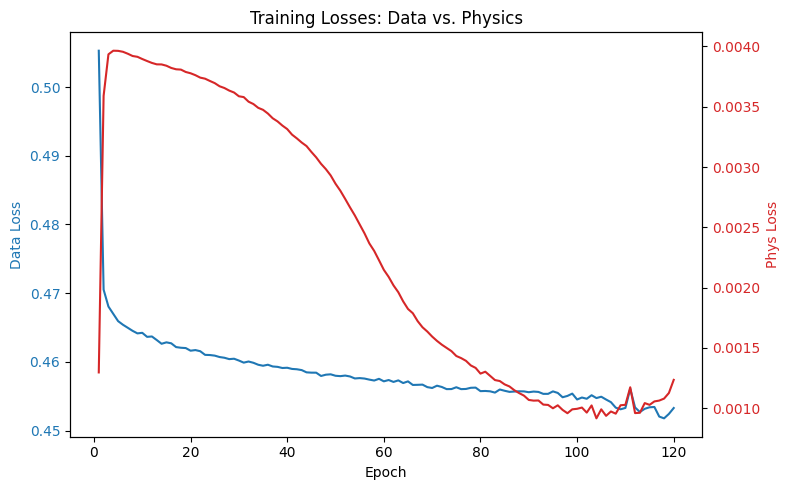


=== Evaluate with Matplotlib (lines) ===
[Matplotlib] Overall MSE: 1.6383


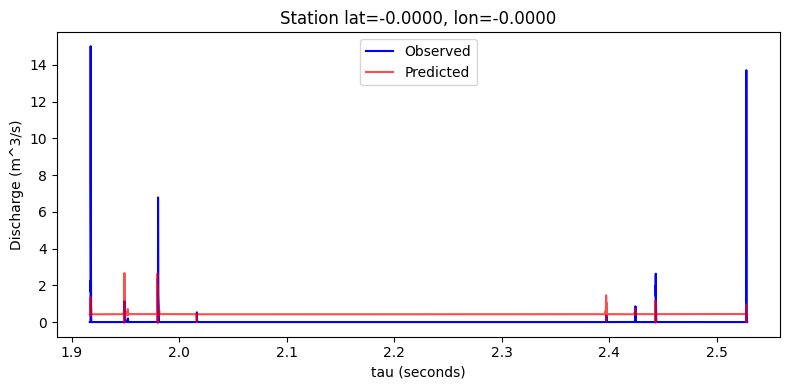


=== Evaluate with Plotly (lines) ===
[Plotly] Overall MSE: 1.6383


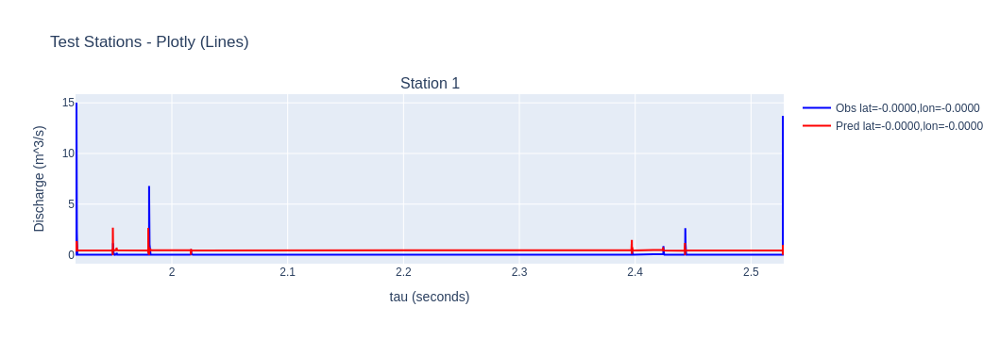


=== Evaluate with Plotly (lines + points, 2-row subplots) ===
[Plotly] Overall MSE: 1.6383


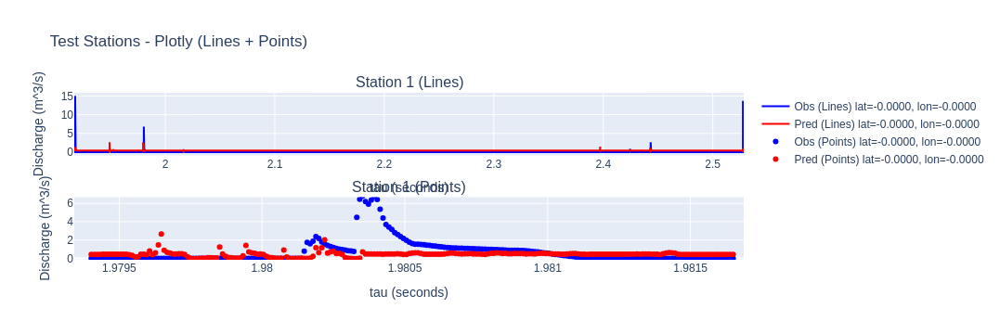

In [11]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    Filter out invalid discharge (rg_qms is NaN),
    then sort by numeric 'tau'.
    """
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    """
    Return all columns EXCEPT:
      - 'EQUATION'  (ignored by request)
      - 'rg_qms'    (this is the target)
      - 'time'      (we have 'tau' instead)
      - possibly 'ID' or others if you don't want them
    """
    exclude_cols = {"EQUATION", "rg_qms", "time","ID"}
    # If you don't want ID or other columns, exclude them too
    # exclude_cols.add("ID")
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    """
    Convert DataFrame to sequences using 'feature_cols'.
    The target is log(rg_qms).
    """
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    We pass all features to LSTM. For infiltration PDE, we specifically need:
      - 'rainrate' index
      - 'DEM' (or elevation) index
      - 'SLOPE' index
    so we can compute infiltration = ReLU(...).
    """
    def __init__(
        self,
        input_size,
        rain_idx,
        dem_idx,
        slope_idx,
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # PDE infiltration parameters
        self.alpha   = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0      = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM    = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        self.relu = nn.ReLU()
        
        # Store indices for PDE
        self.rain_idx  = rain_idx
        self.dem_idx   = dem_idx
        self.slope_idx = slope_idx
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]  # last time-step
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, dem, slope):
        """
        infiltration = ReLU( i0 + iDEM*dem + iSlope*slope )
        """
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=120, lambda_data=1.0, lambda_phys=0.8,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration constraint
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            # 1) Roll through LSTM to get Q_t
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape: (batch,1,features)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)  # actual discharge
                Q_preds.append(Q_t)
            
            # 2) PDE penalty
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len - 1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx + 1]
                
                # parse infiltration columns
                rain_t  = X_batch[:, t_idx, model.rain_idx].unsqueeze(1)
                dem_t   = X_batch[:, t_idx, model.dem_idx].unsqueeze(1)
                slope_t = X_batch[:, t_idx, model.slope_idx].unsqueeze(1)
                
                infil_val = model.infiltration_fn(dem_t, slope_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha * eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len - 1)
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    """
    Evaluate predictions, group by lat/lon, and plot with Matplotlib (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly (Lines)"):
    """
    Evaluate predictions, group by lat/lon, single subplot per station (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 10. New Visualization with Lines + Points
###############################################################################
def evaluate_per_station_plotly_with_points(model, loader, title="Test Stations - Plotly (Lines + Points)"):
    """
    Evaluate predictions, group by lat/lon, and produce a 2-row subplot per station:
      Row 1: lines (same as before)
      Row 2: points (markers) for the same data
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    # Calculate overall MSE
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations
    unique_coords = list(set(zip(all_lat, all_lon)))  # (lat, lon) pairs
    n_stations = len(unique_coords)
    
    # We want 2 rows per station: top row for lines, bottom row for points
    total_rows = 2 * n_stations
    
    # Subplot titles: "Station i (Lines)" and "Station i (Points)"
    subplot_titles = []
    for i in range(n_stations):
        subplot_titles.append(f"Station {i+1} (Lines)")
        subplot_titles.append(f"Station {i+1} (Points)")
    
    fig = make_subplots(
        rows=total_rows, cols=1,
        subplot_titles=subplot_titles
    )
    
    # Sort stations for consistent order
    unique_coords.sort(key=lambda x: (x[0], x[1]))  # by lat, then lon
    
    # Loop over stations
    for i, (lat_st, lon_st) in enumerate(unique_coords, start=1):
        # Filter data
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        tau_st  = all_tau[mask]
        obs_st  = all_truth[mask]
        pred_st = all_preds[mask]
        
        # Sort by time
        idx_sort = np.argsort(tau_st)
        tau_st  = tau_st[idx_sort]
        obs_st  = obs_st[idx_sort]
        pred_st = pred_st[idx_sort]
        
        # Row indices for this station's line + point subplots
        row_lines = 2*i - 1
        row_points = 2*i
        
        # --- (A) Lines Subplot (row_lines) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_lines, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_lines, col=1
        )
        
        # --- (B) Points Subplot (row_points) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='markers',
                name=f"Obs (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='blue', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='markers',
                name=f"Pred (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='red', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * total_rows
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 11. Main
###############################################################################
def main():
    # ---------------------------------------
    # 1) Load Training Data
    # ---------------------------------------
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # ---------------------------------------
    # 2) Load Test Data
    # ---------------------------------------
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # ---------------------------------------
    # 3) Build feature_cols from df_train
    # ---------------------------------------
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # ---------------------------------------
    # 4) Fit & Apply Scaler
    # ---------------------------------------
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # ---------------------------------------
    # 5) Convert to sequences
    # ---------------------------------------
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # ---------------------------------------
    # 6) Indices for PDE infiltration
    # ---------------------------------------
    # Adjust names if your columns differ
    # (For example, if you have 'darga_rain' instead of 'rainrate', adjust accordingly)
    rain_idx  = feature_cols.index("rainrate")
    dem_idx   = feature_cols.index("DEM")
    slope_idx = feature_cols.index("SLOPE")
    
    # ---------------------------------------
    # 7) Instantiate Model
    # ---------------------------------------
    model = LSTMInfiltrationReLU(
        input_size=num_features,
        rain_idx=rain_idx,
        dem_idx=dem_idx,
        slope_idx=slope_idx,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # ---------------------------------------
    # 8) Train
    # ---------------------------------------
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # ---------------------------------------
    # 9) Plot Training Losses
    # ---------------------------------------
    plot_training_losses(data_losses, phys_losses)
    
    # ---------------------------------------
    # 10) Evaluate on Test Set
    # ---------------------------------------
    print("\n=== Evaluate with Matplotlib (lines) ===")
    evaluate_per_station_matplotlib(model, test_loader)
    
    print("\n=== Evaluate with Plotly (lines) ===")
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly (Lines)")
    
    print("\n=== Evaluate with Plotly (lines + points, 2-row subplots) ===")
    evaluate_per_station_plotly_with_points(model, test_loader, title="Test Stations - Plotly (Lines + Points)")

if __name__ == "__main__":
    main()


In [19]:
import torch
import numpy as np
import pandas as pd

# 1) Enable anomaly detection
torch.autograd.set_detect_anomaly(True)

print("============ 1) PyTorch Anomaly Detection Enabled ============")

# 2) Print DataFrame stats for df_train
print("\n============ 2) df_train Describe() ============")
try:
    display(df_train.describe())
except NameError:
    print("[ERROR] df_train not defined. Make sure you have df_train in your notebook.")

# Print min/max for each of the FEATURE_COLS in df_train
print("\n============ 3) Feature Columns (Raw) Range ============")
try:
    for col in FEATURE_COLS:
        col_min = df_train[col].min()
        col_max = df_train[col].max()
        print(f"  {col} => min={col_min}, max={col_max}")
except NameError:
    print("[ERROR] FEATURE_COLS or df_train not defined.")

# 3) If you have a scaled DataFrame, we can print that too
if "scaled_df_train" in globals():
    print("\n============ 4) Feature Columns (Scaled) Range ============")
    for col in FEATURE_COLS:
        col_min = scaled_df_train[col].min()
        col_max = scaled_df_train[col].max()
        print(f"  {col} => min={col_min}, max={col_max}")
else:
    print("\n[INFO] scaled_df_train not found. If you have a scaled dataset, store it in a variable named 'scaled_df_train'.")

print("\n============ 5) PDE Loop Debug Example ============")
print("""
Below is an example snippet you can paste into your training loop 
(inside the PDE portion) for printing Q_t / infiltration / outflow stats:

----------------------------------------------------------------
Q_preds = []
for t_idx in range(seq_len):
    x_t = X_batch[:, t_idx, :].unsqueeze(1)

    if hidden is None:
        lstm_out, hidden = model.lstm(x_t)
    else:
        lstm_out, hidden = model.lstm(x_t, hidden)

    log_q_t = model.fc(lstm_out[:, -1, :])
    Q_t = torch.expm1(log_q_t)

    # -- Debug prints for Q_t:
    print("Q_t stats =>", 
          "min:", Q_t.min().item(), 
          "max:", Q_t.max().item(),
          "mean:", Q_t.mean().item())

    # Optionally clamp Q_t so it won't go negative:
    Q_t = torch.clamp(Q_t, min=1e-6)

    Q_preds.append(Q_t)

# Then when computing infiltration/outflow:
infil_val = model.infiltration_fn(dem_t, slope_t)
# Print infiltration stats
print("infil_val => min:", infil_val.min().item(), "max:", infil_val.max().item())

# Outflow:
outflow = model.kw_outflow(Q_t, slope_t, n_t)
print("outflow => min:", outflow.min().item(), "max:", outflow.max().item())

----------------------------------------------------------------

This will show if any step is producing extreme or negative values.
If an operation yields NaN, set_detect_anomaly(True) will 
raise a traceback pointing to the offending line.
----------------------------------------------------------------
""")

print("\nDone. Scroll up to see the stats and instructions.\n")


============ 1) PyTorch Anomaly Detection Enabled ============

============ 2) df_train Describe() ============
[ERROR] df_train not defined. Make sure you have df_train in your notebook.

============ 3) Feature Columns (Raw) Range ============
[ERROR] FEATURE_COLS or df_train not defined.

[INFO] scaled_df_train not found. If you have a scaled dataset, store it in a variable named 'scaled_df_train'.

============ 5) PDE Loop Debug Example ============

Below is an example snippet you can paste into your training loop 
(inside the PDE portion) for printing Q_t / infiltration / outflow stats:

----------------------------------------------------------------
Q_preds = []
for t_idx in range(seq_len):
    x_t = X_batch[:, t_idx, :].unsqueeze(1)

    if hidden is None:
        lstm_out, hidden = model.lstm(x_t)
    else:
        lstm_out, hidden = model.lstm(x_t, hidden)

    log_q_t = model.fc(lstm_out[:, -1, :])
    Q_t = torch.expm1(log_q_t)

    # -- Debug prints for Q_t:
    print("Q

In [ ]:
import pandas as pd

file_path = "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/darga_rain_2013_with_discharge.parquet"
df_2013 = pd.read_parquet(file_path)

print(df_2013.head())

print("--------------------------------------------------")

file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/darga_rain_2013_with_discharge_events.parquet"
df_2013_eventbase = pd.read_parquet(file_path)

print(df_2013_eventbase.head())

print("--------------------------------------------------")

file_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/event_based/TIME_NORMALIZED/darga_rain_2013_with_discharge_events.parquet"
df_2013_eventbase_tau = pd.read_parquet(file_path)

print(df_2013_eventbase_tau.head())

   ID       time  rainrate   latitude  longitude  AREA_2M  STRM_ORDER  \
0   1 2013-01-01       0.0  31.580134  35.266465   260847           3   
1   2 2013-01-01       0.0  31.600390  35.227964  1510689           3   
2   3 2013-01-01       0.0  31.588026  35.237338    39704           3   
3   4 2013-01-01       0.0  31.588228  35.250409     6199           4   
4   5 2013-01-01       0.0  31.591590  35.237395   565912           3   

   STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  TRIRILEY  \
0            1  509.220426  15.650532  ...  0.000826  0.881682  2.838051   
1            0  722.415574  10.963549  ...  0.000169  0.605801  1.941979   
2            0  636.302826   7.839208  ...  0.007185  0.428774  1.363745   
3            0  607.918402  21.184869  ...  0.012958  1.219254  3.882729   
4            1  620.572343  12.773313  ... -0.002496  0.708091  2.258469   

    TRIRMSD  ROUGHNESS    FLOWDIR  EQUATION D50MM  manning_n  rg_qms  
0  1.003403   2.955264  51.458295

Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 18 input features ===
Epoch [1/120] - DataLoss: 0.5041, PhysLoss: 0.0008
Epoch [2/120] - DataLoss: 0.4696, PhysLoss: 0.0026
Epoch [3/120] - DataLoss: 0.4667, PhysLoss: 0.0031
Epoch [4/120] - DataLoss: 0.4655, PhysLoss: 0.0032
Epoch [5/120] - DataLoss: 0.4650, PhysLoss: 0.0032
Epoch [6/120] - DataLoss: 0.4643, PhysLoss: 0.0032
Epoch [7/120] - DataLoss: 0.4641, PhysLoss: 0.0032
Epoch [8/120] - DataLoss: 0.4633, PhysLoss: 0.0032
Epoch [9/120] - DataLoss: 0.4632, PhysLoss: 0.0031
Epoch [10/120] - DataLoss: 0.4629, PhysLoss: 0.0031
Epoch [11/120] - DataLoss: 0.4627, PhysLoss: 0.0031
Epoch [12/120] - DataLoss: 0.4624, PhysLoss: 0.0031


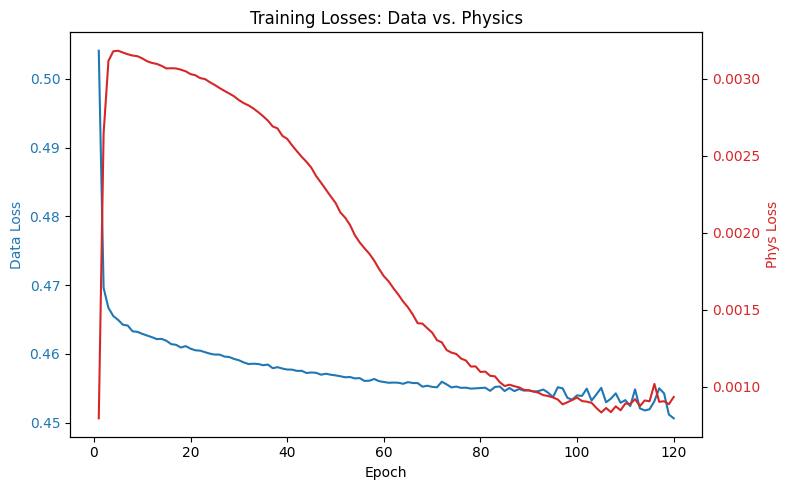


=== Evaluate with Matplotlib (lines) ===
[Matplotlib] Overall MSE: 1.6428


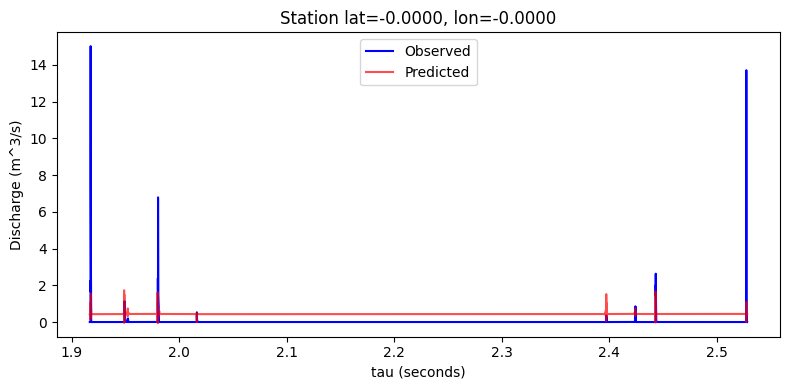


=== Evaluate with Plotly (lines) ===
[Plotly] Overall MSE: 1.6428


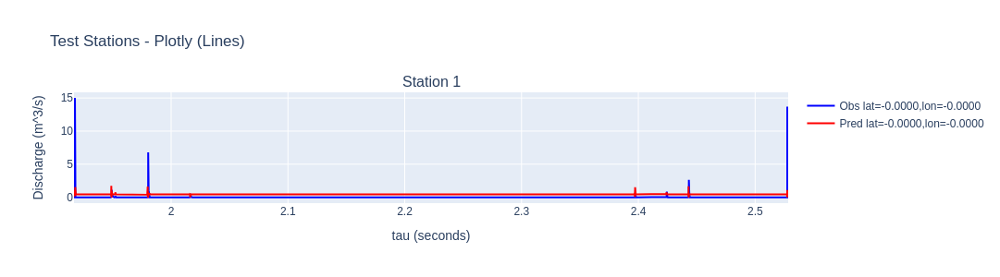


=== Evaluate with Plotly (lines + points, 2-row subplots) ===
[Plotly] Overall MSE: 1.6428


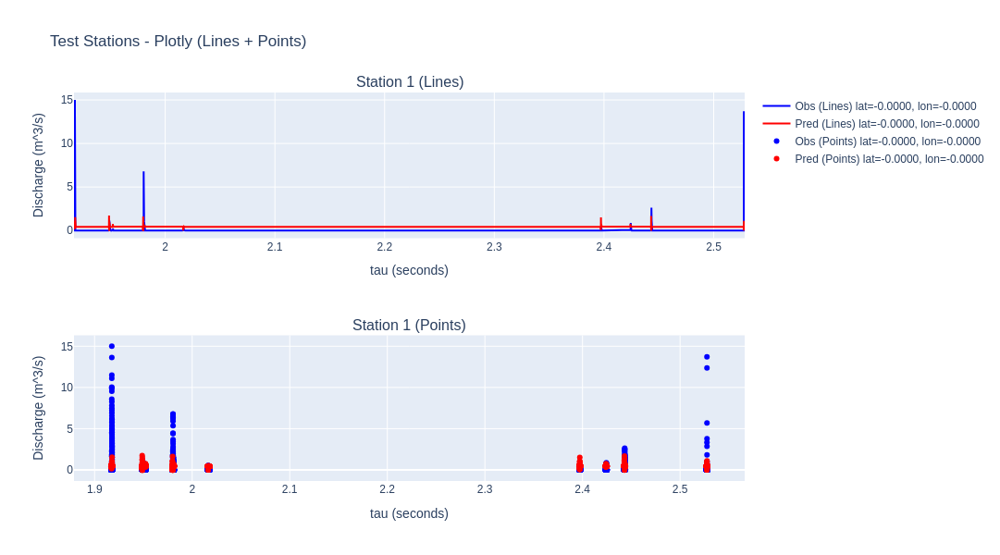

In [3]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    Filter out invalid discharge (rg_qms is NaN),
    then sort by numeric 'tau'.
    """
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    """
    Return all columns EXCEPT:
      - 'EQUATION'  (ignored by request)
      - 'rg_qms'    (this is the target)
      - 'time'      (we have 'tau' instead)
      - possibly 'ID' or others if you don't want them
    """
    exclude_cols = {"EQUATION", "rg_qms", "time","ID"}
    # If you don't want ID or other columns, exclude them too
    # exclude_cols.add("ID")
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    """
    Convert DataFrame to sequences using 'feature_cols'.
    The target is log(rg_qms).
    """
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM + Infiltration PDE
###############################################################################
class LSTMInfiltrationReLU(nn.Module):
    """
    We pass all features to LSTM. For infiltration PDE, we specifically need:
      - 'rainrate' index
      - 'DEM' (or elevation) index
      - 'SLOPE' index
    so we can compute infiltration = ReLU(...).
    """
    def __init__(
        self,
        input_size,
        rain_idx,
        dem_idx,
        slope_idx,
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # PDE infiltration parameters
        self.alpha   = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        self.i0      = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM    = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        self.relu = nn.ReLU()
        
        # Store indices for PDE
        self.rain_idx  = rain_idx
        self.dem_idx   = dem_idx
        self.slope_idx = slope_idx
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]  # last time-step
        log_q_pred = self.fc(out)
        return log_q_pred
    
    def infiltration_fn(self, dem, slope):
        """
        infiltration = ReLU( i0 + iDEM*dem + iSlope*slope )
        """
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer, 
    num_epochs=120, lambda_data=1.0, lambda_phys=0.8,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) PDE infiltration constraint
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            # 1) Roll through LSTM to get Q_t
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape: (batch,1,features)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)  # actual discharge
                Q_preds.append(Q_t)
            
            # 2) PDE penalty
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len - 1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx + 1]
                
                # parse infiltration columns
                rain_t  = X_batch[:, t_idx, model.rain_idx].unsqueeze(1)
                dem_t   = X_batch[:, t_idx, model.dem_idx].unsqueeze(1)
                slope_t = X_batch[:, t_idx, model.slope_idx].unsqueeze(1)
                
                infil_val = model.infiltration_fn(dem_t, slope_t)
                eff_rain  = torch.clamp(rain_t - infil_val, min=0.0)
                
                diff = Q_t1 - Q_t - alpha * eff_rain
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len - 1)
            phys_loss = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    """
    Evaluate predictions, group by lat/lon, and plot with Matplotlib (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly (Lines)"):
    """
    Evaluate predictions, group by lat/lon, single subplot per station (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 10. New Visualization with Lines + Points
###############################################################################
def evaluate_per_station_plotly_with_points(model, loader, title="Test Stations - Plotly (Lines + Points)"):
    """
    Evaluate predictions, group by lat/lon, and produce a 2-row subplot per station:
      Row 1: lines (same as before)
      Row 2: points (markers) for the same data
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    # Calculate overall MSE
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations
    unique_coords = list(set(zip(all_lat, all_lon)))  # (lat, lon) pairs
    n_stations = len(unique_coords)
    
    # We want 2 rows per station: top row for lines, bottom row for points
    total_rows = 2 * n_stations
    
    # Subplot titles: "Station i (Lines)" and "Station i (Points)"
    subplot_titles = []
    for i in range(n_stations):
        subplot_titles.append(f"Station {i+1} (Lines)")
        subplot_titles.append(f"Station {i+1} (Points)")
    
    fig = make_subplots(
        rows=total_rows, cols=1,
        subplot_titles=subplot_titles
    )
    
    # Sort stations for consistent order
    unique_coords.sort(key=lambda x: (x[0], x[1]))  # by lat, then lon
    
    # Loop over stations
    for i, (lat_st, lon_st) in enumerate(unique_coords, start=1):
        # Filter data
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        tau_st  = all_tau[mask]
        obs_st  = all_truth[mask]
        pred_st = all_preds[mask]
        
        # Sort by time
        idx_sort = np.argsort(tau_st)
        tau_st  = tau_st[idx_sort]
        obs_st  = obs_st[idx_sort]
        pred_st = pred_st[idx_sort]
        
        # Row indices for this station's line + point subplots
        row_lines = 2*i - 1
        row_points = 2*i
        
        # --- (A) Lines Subplot (row_lines) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_lines, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_lines, col=1
        )
        
        # --- (B) Points Subplot (row_points) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='markers',
                name=f"Obs (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='blue', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='markers',
                name=f"Pred (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='red', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * total_rows
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()


###############################################################################
# 11. Main
###############################################################################
def main():
    # ---------------------------------------
    # 1) Load Training Data
    # ---------------------------------------
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # ---------------------------------------
    # 2) Load Test Data
    # ---------------------------------------
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # ---------------------------------------
    # 3) Build feature_cols from df_train
    # ---------------------------------------
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # ---------------------------------------
    # 4) Fit & Apply Scaler
    # ---------------------------------------
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # ---------------------------------------
    # 5) Convert to sequences
    # ---------------------------------------
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # ---------------------------------------
    # 6) Indices for PDE infiltration
    # ---------------------------------------
    # Adjust names if your columns differ
    # (For example, if you have 'darga_rain' instead of 'rainrate', adjust accordingly)
    rain_idx  = feature_cols.index("rainrate")
    dem_idx   = feature_cols.index("DEM")
    slope_idx = feature_cols.index("SLOPE")
    
    # ---------------------------------------
    # 7) Instantiate Model
    # ---------------------------------------
    model = LSTMInfiltrationReLU(
        input_size=num_features,
        rain_idx=rain_idx,
        dem_idx=dem_idx,
        slope_idx=slope_idx,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # ---------------------------------------
    # 8) Train
    # ---------------------------------------
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # ---------------------------------------
    # 9) Plot Training Losses
    # ---------------------------------------
    plot_training_losses(data_losses, phys_losses)
    
    # ---------------------------------------
    # 10) Evaluate on Test Set
    # ---------------------------------------
    print("\n=== Evaluate with Matplotlib (lines) ===")
    evaluate_per_station_matplotlib(model, test_loader)
    
    print("\n=== Evaluate with Plotly (lines) ===")
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly (Lines)")
    
    print("\n=== Evaluate with Plotly (lines + points, 2-row subplots) ===")
    evaluate_per_station_plotly_with_points(model, test_loader, title="Test Stations - Plotly (Lines + Points)")

if __name__ == "__main__":
    main()


In [ ]:
#kinematic wave equation and not "weak physics" with colloaction points. 

Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 18 input features ===
Epoch [1/120] - DataLoss: 0.5046, PhysLoss: 0.0016
Epoch [2/120] - DataLoss: 0.4705, PhysLoss: 0.0042
Epoch [3/120] - DataLoss: 0.4681, PhysLoss: 0.0045
Epoch [4/120] - DataLoss: 0.4671, PhysLoss: 0.0046
Epoch [5/120] - DataLoss: 0.4662, PhysLoss: 0.0046
Epoch [6/120] - DataLoss: 0.4657, PhysLoss: 0.0045
Epoch [7/120] - DataLoss: 0.4654, PhysLoss: 0.0045
Epoch [8/120] - DataLoss: 0.4650, PhysLoss: 0.0045
Epoch [9/120] - DataLoss: 0.4645, PhysLoss: 0.0045
Epoch [10/120] - DataLoss: 0.4643, PhysLoss: 0.0045
Epoch [11/120] - DataLoss: 0.4644, PhysLoss: 0.0044
Epoch [12/120] - DataLoss: 0.4640, PhysLoss: 0.0044


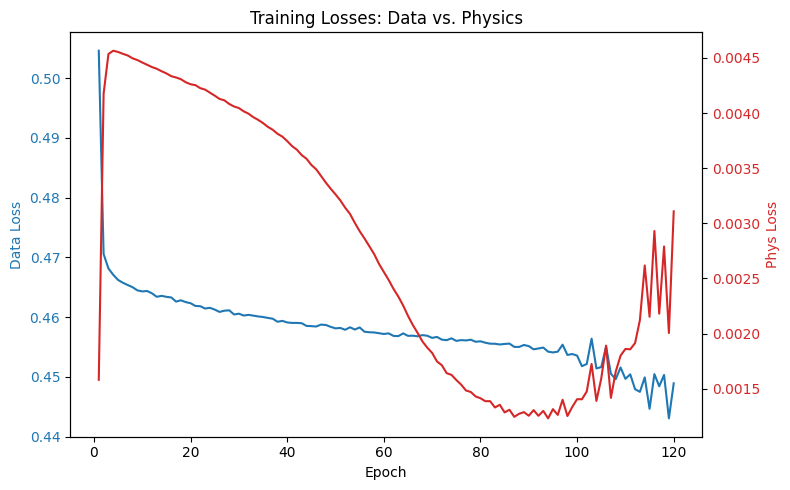


=== Evaluate with Matplotlib (lines) ===
[Matplotlib] Overall MSE: 1.7681


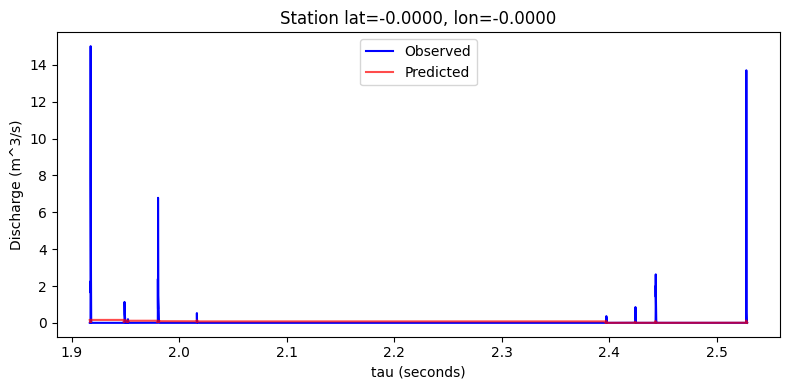


=== Evaluate with Plotly (lines) ===
[Plotly] Overall MSE: 1.7681


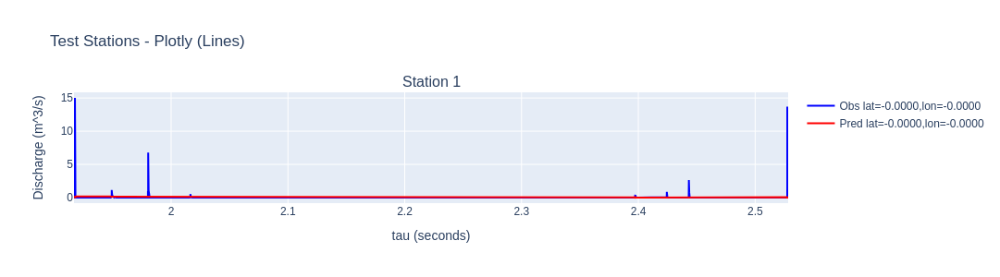


=== Evaluate with Plotly (lines + points, 2-row subplots) ===
[Plotly] Overall MSE: 1.7681


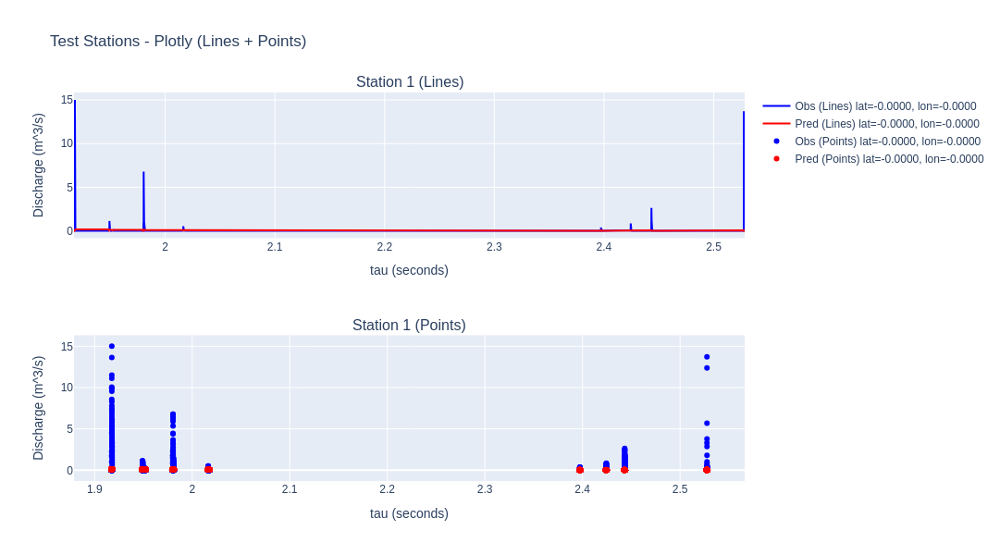

In [15]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    Filter out invalid discharge (rg_qms is NaN),
    then sort by numeric 'tau'.
    """
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    """
    Return all columns EXCEPT:
      - 'EQUATION'  (ignored by request)
      - 'rg_qms'    (this is the target)
      - 'time'      (we have 'tau' instead)
      - 'ID'        (excluded here)
    """
    exclude_cols = {"EQUATION", "rg_qms", "time", "ID"}
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    """
    Convert DataFrame to sequences using 'feature_cols'.
    The target is log(rg_qms).
    """
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM + Kinematic Wave Physics
###############################################################################
class LSTMKinematicWave(nn.Module):
    """
    We pass all features to LSTM. For the kinematic-wave PDE, we specifically need:
      - 'rainrate' index
      - 'SLOPE' index
    We'll penalize Q_{t+1} - Q_t - alpha * (slope_t * rain_t).
    """
    def __init__(
        self,
        input_size,
        rain_idx,
        slope_idx,
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # PDE kinematic-wave parameter
        self.alpha = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        
        self.rain_idx = rain_idx
        self.slope_idx = slope_idx
    
    def forward(self, x):
        lstm_out, (h_n, c_n) = self.lstm(x)
        out = lstm_out[:, -1, :]  # last time-step
        log_q_pred = self.fc(out)
        return log_q_pred

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    """
    Weighted MSE that puts higher emphasis on larger flows.
    weight = 1 + beta * (Q_true / global_qmax).
    """
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true) ** 2
    return torch.mean(w * diff)

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer,
    num_epochs=120, lambda_data=1.0, lambda_phys=0.8,
    beta_weight=15.0, global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # (A) Data Loss
            log_q_pred = model(X_batch)
            data_loss_val = weighted_mse_loss(
                log_q_pred, y_log_batch,
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # (B) Kinematic-Wave Physics penalty
            # We'll roll through the LSTM time steps to get Q_t at each step,
            # then compute PDE penalty = sum of (Q_{t+1} - Q_t - alpha * slope_t * rain_t)^2
            Q_preds = []
            hidden = None
            seq_len = X_batch.size(1)
            
            for t_idx in range(seq_len):
                x_t = X_batch[:, t_idx, :].unsqueeze(1)  # shape: (batch,1,features)
                if hidden is None:
                    lstm_out, hidden = model.lstm(x_t)
                else:
                    lstm_out, hidden = model.lstm(x_t, hidden)
                log_q_t = model.fc(lstm_out[:, -1, :])
                Q_t = torch.expm1(log_q_t)  # actual discharge at time t
                Q_preds.append(Q_t)
            
            penalty = 0.0
            alpha = model.alpha
            for t_idx in range(seq_len - 1):
                Q_t  = Q_preds[t_idx]
                Q_t1 = Q_preds[t_idx + 1]
                
                rain_t  = X_batch[:, t_idx, model.rain_idx].unsqueeze(1)
                slope_t = X_batch[:, t_idx, model.slope_idx].unsqueeze(1)
                
                diff = Q_t1 - Q_t - alpha * (slope_t * rain_t)
                penalty += torch.mean(diff**2)
            
            if seq_len > 1:
                penalty = penalty / (seq_len - 1)
            
            phys_loss_val = penalty * lambda_phys
            
            total_loss = data_loss_val + phys_loss_val
            total_loss.backward()
            optimizer.step()
            
            # Accumulate stats
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += penalty.item()
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    """
    Evaluate predictions, group by lat/lon, and plot with Matplotlib (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly (Lines)"):
    """
    Evaluate predictions, group by lat/lon, single subplot per station (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f},lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 10. New Visualization with Lines + Points
###############################################################################
def evaluate_per_station_plotly_with_points(model, loader, title="Test Stations - Plotly (Lines + Points)"):
    """
    Evaluate predictions, group by lat/lon, and produce a 2-row subplot per station:
      Row 1: lines (same as before)
      Row 2: points (markers) for the same data
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    # Calculate overall MSE
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations
    unique_coords = list(set(zip(all_lat, all_lon)))  # (lat, lon) pairs
    n_stations = len(unique_coords)
    
    # We want 2 rows per station: top row for lines, bottom row for points
    total_rows = 2 * n_stations
    
    # Subplot titles: "Station i (Lines)" and "Station i (Points)"
    subplot_titles = []
    for i in range(n_stations):
        subplot_titles.append(f"Station {i+1} (Lines)")
        subplot_titles.append(f"Station {i+1} (Points)")
    
    fig = make_subplots(
        rows=total_rows, cols=1,
        subplot_titles=subplot_titles
    )
    
    # Sort stations for consistent order
    unique_coords.sort(key=lambda x: (x[0], x[1]))  # by lat, then lon
    
    # Loop over stations
    for i, (lat_st, lon_st) in enumerate(unique_coords, start=1):
        # Filter data
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        tau_st  = all_tau[mask]
        obs_st  = all_truth[mask]
        pred_st = all_preds[mask]
        
        # Sort by time
        idx_sort = np.argsort(tau_st)
        tau_st  = tau_st[idx_sort]
        obs_st  = obs_st[idx_sort]
        pred_st = pred_st[idx_sort]
        
        # Row indices for this station's line + point subplots
        row_lines = 2*i - 1
        row_points = 2*i
        
        # --- (A) Lines Subplot (row_lines) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_lines, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_lines, col=1
        )
        
        # --- (B) Points Subplot (row_points) ---
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='markers',
                name=f"Obs (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='blue', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='markers',
                name=f"Pred (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='red', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * total_rows
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 11. Main
###############################################################################
def main():
    # ---------------------------------------
    # 1) Load Training Data
    # ---------------------------------------
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # ---------------------------------------
    # 2) Load Test Data
    # ---------------------------------------
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # ---------------------------------------
    # 3) Build feature_cols from df_train
    # ---------------------------------------
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # ---------------------------------------
    # 4) Fit & Apply Scaler
    # ---------------------------------------
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # ---------------------------------------
    # 5) Convert to sequences
    # ---------------------------------------
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # ---------------------------------------
    # 6) Indices for PDE (Kinematic Wave)
    # ---------------------------------------
    # Adjust names if your columns differ
    rain_idx  = feature_cols.index("rainrate")
    slope_idx = feature_cols.index("SLOPE")
    
    # ---------------------------------------
    # 7) Instantiate Model
    # ---------------------------------------
    model = LSTMKinematicWave(
        input_size=num_features,
        rain_idx=rain_idx,
        slope_idx=slope_idx,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # ---------------------------------------
    # 8) Train
    # ---------------------------------------
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # ---------------------------------------
    # 9) Plot Training Losses
    # ---------------------------------------
    plot_training_losses(data_losses, phys_losses)
    
    # ---------------------------------------
    # 10) Evaluate on Test Set
    # ---------------------------------------
    print("\n=== Evaluate with Matplotlib (lines) ===")
    evaluate_per_station_matplotlib(model, test_loader)
    
    print("\n=== Evaluate with Plotly (lines) ===")
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly (Lines)")
    
    print("\n=== Evaluate with Plotly (lines + points, 2-row subplots) ===")
    evaluate_per_station_plotly_with_points(model, test_loader, title="Test Stations - Plotly (Lines + Points)")

if __name__ == "__main__":
    main()


Epoch [1/30] - DataLoss: 305.3055, PhysLoss: 9.1260
Epoch [2/30] - DataLoss: 246.5746, PhysLoss: 9.0182
Epoch [3/30] - DataLoss: 143.7335, PhysLoss: 9.0104
Epoch [4/30] - DataLoss: 92.5991, PhysLoss: 9.1282
Epoch [5/30] - DataLoss: 64.8005, PhysLoss: 9.5528
Epoch [6/30] - DataLoss: 46.8240, PhysLoss: 10.4844
Epoch [7/30] - DataLoss: 29.8440, PhysLoss: 12.9934
Epoch [8/30] - DataLoss: 19.7850, PhysLoss: 15.6598
Epoch [9/30] - DataLoss: 15.3072, PhysLoss: 17.9317
Epoch [10/30] - DataLoss: 13.1855, PhysLoss: 19.2700
Epoch [11/30] - DataLoss: 11.8038, PhysLoss: 19.9625
Epoch [12/30] - DataLoss: 11.1725, PhysLoss: 20.6108
Epoch [13/30] - DataLoss: 10.4033, PhysLoss: 21.0680
Epoch [14/30] - DataLoss: 9.9404, PhysLoss: 21.2932
Epoch [15/30] - DataLoss: 9.6359, PhysLoss: 16.9327
Epoch [16/30] - DataLoss: 8.3580, PhysLoss: 12.8472
Epoch [17/30] - DataLoss: 7.5336, PhysLoss: 10.1090
Epoch [18/30] - DataLoss: 6.4172, PhysLoss: 7.9483
Epoch [19/30] - DataLoss: 5.5354, PhysLoss: 5.7386
Epoch [20/30

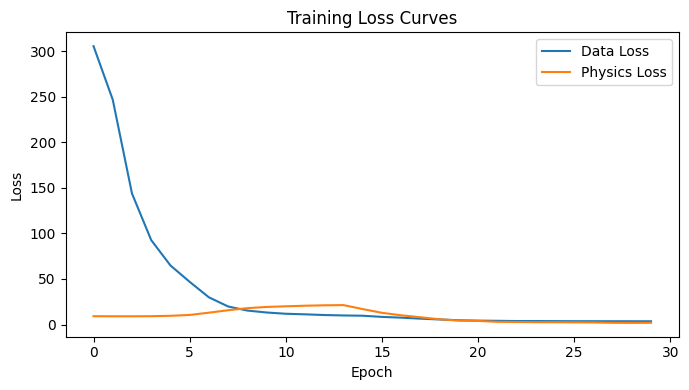


Learned infiltration/wave parameters:
  i0      = 0.1092
  iDEM    = -2.4087e-03
  iSlope  = 2.0272e-02
  c_wave  = 0.0500


In [17]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

###############################################################################
# 1. Hyperparams + Toy Data Setup
###############################################################################
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -- LSTM config
HIDDEN_SIZE = 32
NUM_LAYERS = 1
DROPOUT = 0.0
BATCH_SIZE = 8
EPOCHS = 30
LR = 1e-3

# -- Weighted MSE config
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 50.0

# -- Physics coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.5  # overall weight for PDE penalty

# PDE discretization (toy)
DELTA_T = 1.0   # time step
DELTA_X = 100.0 # space step
# We'll do a single-station approach for demonstration, so dQ/dx ~ 0. 

###############################################################################
# 2. Toy Data Generation (Time x Space)
###############################################################################
def generate_toy_data(num_time=50, num_cells=5):
    """
    Generates a toy dataset of shape [num_time, num_cells], with:
      - random DEM, random SLOPE for each cell
      - random rainfall
      - 'observed' Q that satisfies a rough infiltration + wave PDE
    """
    np.random.seed(42)
    
    DEM = np.random.uniform(low=200, high=400, size=num_cells).astype(np.float32)
    SLOPE = np.random.uniform(low=0.01, high=0.1, size=num_cells).astype(np.float32)
    
    # infiltration parameters (true)
    i0_true      = 0.05
    iDEM_true    = -1e-4
    iSlope_true  = 0.1
    
    infiltration_raw = i0_true + iDEM_true*DEM + iSlope_true*SLOPE
    infiltration_raw = np.clip(infiltration_raw, a_min=0.0, a_max=None)
    
    rain = np.zeros((num_time, num_cells), dtype=np.float32)
    for n in range(num_time):
        if np.random.rand() < 0.2:  # 20% chance it rains
            rain_val = np.random.uniform(0.0, 10.0)
            rain[n,:] = rain_val
    
    Q_true = np.zeros((num_time, num_cells), dtype=np.float32)
    # simple forward iteration for Q
    C_SPEED = 0.1
    for n in range(num_time - 1):
        for j in range(num_cells):
            if j == 0:
                Q_left = 0.0
            else:
                Q_left = Q_true[n, j-1]
            Ij = infiltration_raw[j]
            # PDE discrete approx
            Q_true[n+1, j] = Q_true[n, j] + DELTA_T * (
                -C_SPEED * (Q_true[n, j] - Q_left)/DELTA_X + (rain[n, j] - Ij)
            )
            Q_true[n+1, j] = max(Q_true[n+1, j], 0.0)
    
    rows = []
    for n in range(num_time):
        for j in range(num_cells):
            rows.append({
                "time_idx": n,
                "cell_idx": j,
                "rain": rain[n,j],
                "DEM": DEM[j],
                "SLOPE": SLOPE[j],
                "Qobs": Q_true[n,j]
            })
    df = pd.DataFrame(rows)
    return df

###############################################################################
# 3. Dataset + DataLoader
###############################################################################
class ToyWaveDataset(Dataset):
    """
    We create sequences in time for each cell. 
    Features: [rain, DEM, SLOPE].
    Target: next-step Q (log(1+Q)).
    """
    def __init__(self, df, seq_len=5):
        super().__init__()
        df_sorted = df.sort_values(["cell_idx","time_idx"]).reset_index(drop=True)
        self.seq_len = seq_len
        self.samples = []
        
        grouped = df_sorted.groupby("cell_idx")
        for cell_id, group in grouped:
            group = group.sort_values("time_idx")
            arr_rain = group["rain"].values.astype(np.float32)
            arr_dem  = group["DEM"].values.astype(np.float32)
            arr_slope= group["SLOPE"].values.astype(np.float32)
            arr_qobs = group["Qobs"].values.astype(np.float32)
            times    = group["time_idx"].values.astype(np.float32)
            
            N = len(group)
            for i in range(N - seq_len):
                Xfeat = np.stack([
                    arr_rain[i : i+seq_len],
                    arr_dem [i : i+seq_len],
                    arr_slope[i: i+seq_len]
                ], axis=1)  # (seq_len, 3)
                
                y_next = arr_qobs[i + seq_len]  # next-step Q
                t_next = times[i + seq_len]
                
                self.samples.append({
                    "X": Xfeat, 
                    "y": np.log1p(y_next),
                    "cell_idx": cell_id,
                    "time_idx": t_next
                })
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        item = self.samples[idx]
        X = item["X"]        # shape (seq_len, 3)
        y_log = item["y"]    # log(Q+1)
        cell_id = item["cell_idx"]
        t_id    = item["time_idx"]
        return (
            torch.from_numpy(X), 
            torch.tensor(y_log, dtype=torch.float32),
            torch.tensor(cell_id, dtype=torch.long),
            torch.tensor(t_id,   dtype=torch.float32)
        )

###############################################################################
# 4. Model: LSTM with 'return_sequences' Option
###############################################################################
class LSTMInfiltrationKWave(nn.Module):
    """
    LSTM that can return the entire sequence or only the last time-step.
    We store infiltration parameters, wave speed, etc.
    """
    def __init__(self, input_size=3, hidden_size=32, num_layers=1, dropout=0.0):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # infiltration parameters
        self.i0      = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM    = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        # wave speed
        self.c_wave  = nn.Parameter(torch.tensor(0.05, dtype=torch.float32))
        
        self.relu = nn.ReLU()
    
    def forward_all_timesteps(self, x):
        """
        Returns logQ for every time step.
        x shape: (batch, seq_len, 3) => [rain, DEM, SLOPE]
        
        Output shape: (batch, seq_len, 1)
        """
        lstm_out, (h_n, c_n) = self.lstm(x)  # shape => (batch, seq_len, hidden_size)
        log_q_seq = self.fc(lstm_out)       # shape => (batch, seq_len, 1)
        return log_q_seq
    
    def infiltration_fn(self, dem, slope):
        """
        infiltration = ReLU( i0 + iDEM*dem + iSlope*slope )
        """
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 5. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=50.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

def compute_infiltration_kwave_residual(model, X, log_q_seq):
    """
    PDE: dQ/dt + c dQ/dx = (rain - infiltration).
    We'll do the single-station version => dQ/dx ~ 0.
    So residual = (Q_{t+1} - Q_t)/dt - (rain_t - infiltration).
    
    - X shape: (batch, seq_len, 3) => [rain, DEM, SLOPE]
    - log_q_seq shape: (batch, seq_len, 1), predicted logQ for each time-step
    """
    Q_seq = torch.expm1(log_q_seq)  # shape (batch, seq_len, 1)
    
    # infiltration depends only on DEM, Slope => use the first time-step for them
    dem_vals   = X[:, 0, 1].unsqueeze(1)   # (batch,1)
    slope_vals = X[:, 0, 2].unsqueeze(1)   # (batch,1)
    infiltration_vals = model.infiltration_fn(dem_vals, slope_vals)  # (batch,1)
    
    dt = DELTA_T
    c = model.c_wave
    
    # We'll just do single-station, ignoring c*dQ/dx => 0
    # residual = Q_{t+1} - Q_t - dt*(rain_t - infiltration)
    
    # Sum MSE across t in [0..seq_len-2]
    penalty = 0.0
    seq_len = X.size(1)
    for t in range(seq_len - 1):
        Q_t  = Q_seq[:, t, :]      # (batch,1)
        Q_tp1= Q_seq[:, t+1, :]    # (batch,1)
        rain_t = X[:, t, 0].unsqueeze(1)  # (batch,1)

        resid_t = Q_tp1 - Q_t - dt*(rain_t - infiltration_vals)
        penalty += torch.mean(resid_t**2)
    
    if seq_len > 1:
        penalty = penalty / (seq_len - 1)
    
    return penalty

###############################################################################
# 6. Training Loop
###############################################################################
def train_model(
    model, loader, num_epochs=30,
    lambda_data=1.0,
    lambda_phys=0.5,
    beta_weight=15.0,
    global_qmax=50.0
):
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, cell_ids, t_ids in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass: get logQ predictions for all time steps
            log_q_seq = model.forward_all_timesteps(X_batch)  
            # log_q_seq: (batch, seq_len, 1)
            
            # The data target is the *last time-step* => shape (batch,)
            # We'll get that from log_q_seq[:, -1, 0]
            log_q_pred_last = log_q_seq[:, -1, 0]
            
            data_loss_val = weighted_mse_loss(
                log_q_pred_last, y_log_batch,
                beta=beta_weight,
                global_qmax=global_qmax
            ) * lambda_data
            
            # PDE penalty over entire sequence
            phys_pen = compute_infiltration_kwave_residual(model, X_batch, log_q_seq)
            phys_pen = phys_pen * lambda_phys
            
            total_loss = data_loss_val + phys_pen
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += phys_pen.item() / max(lambda_phys, 1e-9)
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 7. Simple Plot of Losses
###############################################################################
def plot_losses(data_losses, phys_losses):
    plt.figure(figsize=(7,4))
    plt.plot(data_losses, label="Data Loss")
    plt.plot(phys_losses, label="Physics Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training Loss Curves")
    plt.tight_layout()
    plt.show()

###############################################################################
# 8. Main Demo
###############################################################################
def main():
    # 1) Generate synthetic dataset
    df = generate_toy_data(num_time=60, num_cells=5)
    
    # 2) Create dataset, loader
    dataset = ToyWaveDataset(df, seq_len=6)
    loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
    
    # 3) Instantiate model
    model = LSTMInfiltrationKWave(
        input_size=3,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    # 4) Train
    data_losses, phys_losses = train_model(
        model=model,
        loader=loader,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 5) Plot losses
    plot_losses(data_losses, phys_losses)
    
    # Print final infiltration and wave parameters
    print("\nLearned infiltration/wave parameters:")
    print(f"  i0      = {model.i0.item():.4f}")
    print(f"  iDEM    = {model.iDEM.item():.4e}")
    print(f"  iSlope  = {model.iSlope.item():.4e}")
    print(f"  c_wave  = {model.c_wave.item():.4f}")

if __name__ == "__main__":
    main()


Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 18 input features ===
Epoch [1/120] - DataLoss: 0.5156, PhysLoss: 0.0016
Epoch [2/120] - DataLoss: 0.4717, PhysLoss: 0.0048
Epoch [3/120] - DataLoss: 0.4692, PhysLoss: 0.0051
Epoch [4/120] - DataLoss: 0.4678, PhysLoss: 0.0051
Epoch [5/120] - DataLoss: 0.4670, PhysLoss: 0.0051
Epoch [6/120] - DataLoss: 0.4666, PhysLoss: 0.0051
Epoch [7/120] - DataLoss: 0.4660, PhysLoss: 0.0050
Epoch [8/120] - DataLoss: 0.4658, PhysLoss: 0.0050
Epoch [9/120] - DataLoss: 0.4650, PhysLoss: 0.0050
Epoch [10/120] - DataLoss: 0.4648, PhysLoss: 0.0050
Epoch [11/120] - DataLoss: 0.4650, PhysLoss: 0.0049
Epoch [12/120] - DataLoss: 0.4643, PhysLoss: 0.0049


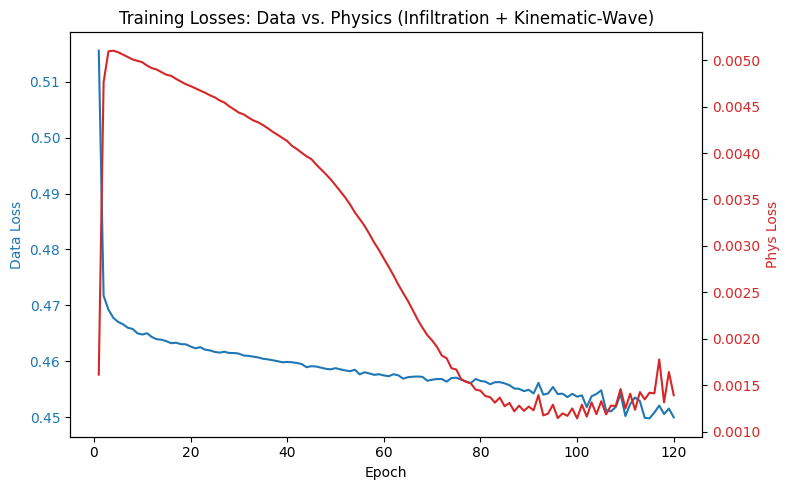


=== Evaluate with Matplotlib (lines) ===
[Matplotlib] Overall MSE: 1.7404


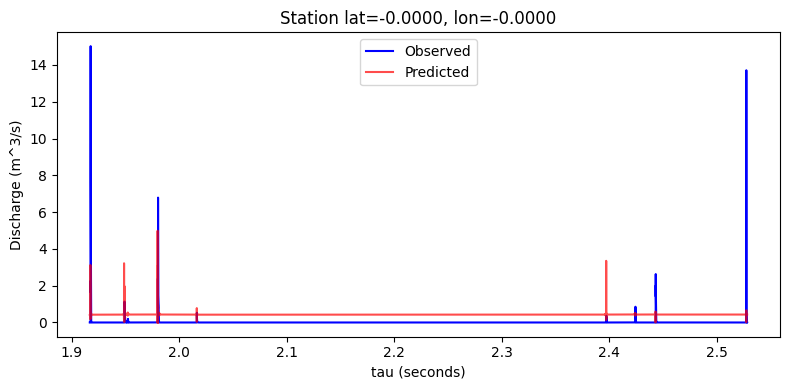


=== Evaluate with Plotly (lines) ===
[Plotly] Overall MSE: 1.7404


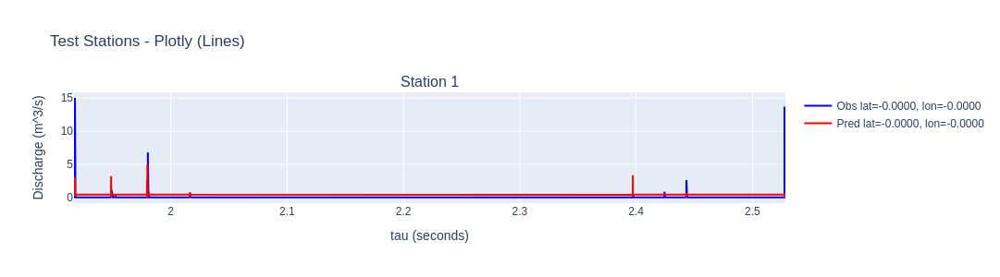


=== Evaluate with Plotly (lines + points, 2-row subplots) ===
[Plotly] Overall MSE: 1.7404


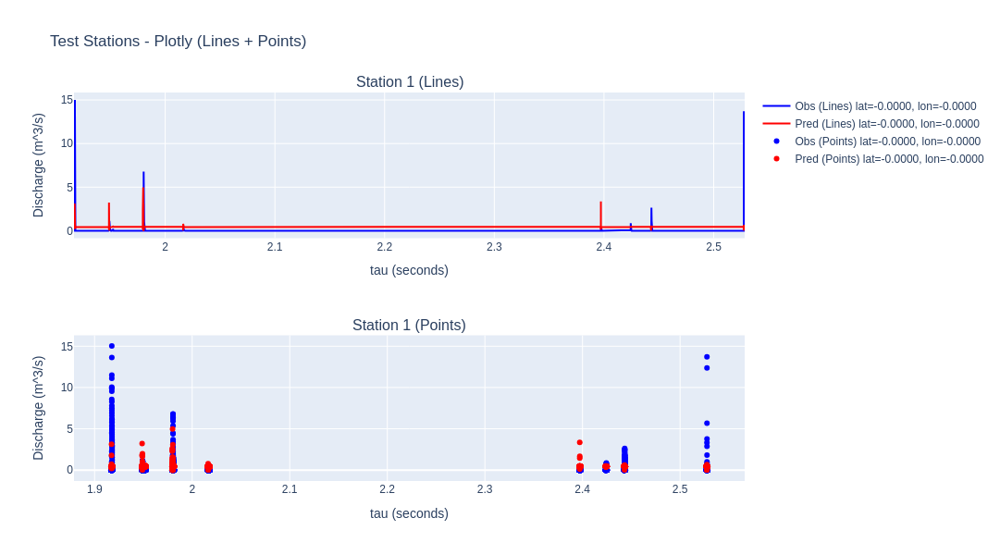

In [18]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    """
    Reads multiple Parquet files, concatenates into a single DataFrame.
    """
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    """
    Filter out invalid discharge (rg_qms is NaN),
    then sort by numeric 'tau'.
    """
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    """
    Return all columns EXCEPT:
      - 'EQUATION'
      - 'rg_qms'   (the target)
      - 'time'     (we have 'tau' instead)
      - 'ID'       (excluded by default)
    """
    exclude_cols = {"EQUATION", "rg_qms", "time", "ID"}
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    """
    Convert DataFrame to sequences using 'feature_cols'.
    The target is log(rg_qms).
    """
    feats = df[feature_cols].values.astype(np.float32)
    
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])
        
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM with Infiltration + Kinematic-Wave (Single-Station)
###############################################################################
class LSTMInfiltrationKWave(nn.Module):
    """
    LSTM that returns log(Q) for each time-step so we can compute:
      Data loss = MSE on the final time-step,
      Physics penalty across the entire sequence.

    PDE (single-station):
      Q_{t+1} - Q_t - c_wave * [slope_t * (rain_t - infiltration)] = 0
      infiltration = ReLU(i0 + iDEM*DEM + iSlope*SLOPE).
    """
    def __init__(
        self,
        input_size,
        rain_idx,
        dem_idx,
        slope_idx,
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q) per time-step
        
        # infiltration parameters
        self.i0      = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iDEM    = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        # wave-speed-like parameter
        self.c_wave  = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        
        self.relu = nn.ReLU()
        
        self.rain_idx  = rain_idx
        self.dem_idx   = dem_idx
        self.slope_idx = slope_idx

    def forward(self, x, return_sequences=False):
        """
        x: shape (batch, seq_len, input_size)
        If return_sequences=True, returns log(Q) for all time steps => (batch, seq_len, 1)
        Otherwise returns last time-step => (batch, 1).
        """
        lstm_out, (h_n, c_n) = self.lstm(x)   # (batch, seq_len, hidden_size)
        log_q_all = self.fc(lstm_out)        # (batch, seq_len, 1)
        
        if return_sequences:
            return log_q_all
        else:
            # just last time-step
            return log_q_all[:, -1, :]  # shape (batch, 1)
    
    def infiltration_fn(self, dem, slope):
        """
        infiltration = ReLU(i0 + iDEM*DEM + iSlope*SLOPE)
        dem, slope: (batch,) or (batch,1)
        """
        raw_infil = self.i0 + self.iDEM * dem + self.iSlope * slope
        return self.relu(raw_infil)

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    """
    Weighted MSE that emphasizes bigger flows more.
    """
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

def compute_infiltration_kwave_residual(
    model, X_batch, log_q_all
):
    """
    Single-station PDE:
      Q_{t+1} - Q_t - c_wave * [ slope_t * (rain_t - infiltration) ] = 0

    - X_batch shape: (batch, seq_len, input_size)
    - log_q_all shape: (batch, seq_len, 1)

    We'll loop over t in [0..seq_len-2].
    infiltration depends on DEM,SLOPE => from X_batch[:, t, dem_idx], X_batch[:, t, slope_idx]
    but they are presumably constant across time steps for a station. We'll just use the t-th step.
    """
    Q_all = torch.expm1(log_q_all)  # shape (batch, seq_len, 1)
    
    batch_size, seq_len, _ = log_q_all.shape
    c_wave = model.c_wave
    
    penalty = 0.0
    
    for t in range(seq_len - 1):
        Q_t  = Q_all[:, t, :]      # (batch,1)
        Q_tp1= Q_all[:, t+1, :]    # (batch,1)
        
        # parse infiltration
        rain_t  = X_batch[:, t, model.rain_idx]   # shape (batch,)
        dem_t   = X_batch[:, t, model.dem_idx]
        slope_t = X_batch[:, t, model.slope_idx]
        
        infiltration_t = model.infiltration_fn(dem_t, slope_t)  # (batch,)
        # effective rain
        eff_rain_t = rain_t - infiltration_t
        eff_rain_t = torch.clamp(eff_rain_t, min=0.0)  # non-negative

        # PDE residual
        resid_t = Q_tp1 - Q_t - c_wave * (slope_t.unsqueeze(1) * eff_rain_t.unsqueeze(1))
        penalty += torch.mean(resid_t**2)
    
    if (seq_len - 1) > 0:
        penalty = penalty / (seq_len - 1)
    
    return penalty

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model, train_loader, optimizer,
    num_epochs=120,
    lambda_data=1.0,
    lambda_phys=0.8,
    beta_weight=15.0,
    global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # 1) Forward pass: get log(Q) for all time-steps
            log_q_all = model(X_batch, return_sequences=True)  # (batch, seq_len, 1)

            # Data loss => only last time-step vs. y_log_batch
            log_q_pred_last = log_q_all[:, -1, 0]  # shape (batch,)
            data_loss_val = weighted_mse_loss(
                log_q_pred_last, y_log_batch.flatten(),
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # 2) Physics penalty across entire sequence
            phys_pen = compute_infiltration_kwave_residual(model, X_batch, log_q_all)
            phys_pen = phys_pen * lambda_phys
            
            total_loss = data_loss_val + phys_pen
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += phys_pen.item() / max(lambda_phys, 1e-9)
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics (Infiltration + Kinematic-Wave)")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    """
    Evaluate predictions, group by lat/lon, and plot with Matplotlib (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            # We only need last time-step for direct comparisons
            log_q_pred = model(X_batch, return_sequences=False)  # shape (batch,1)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    # Concatenate
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    # Identify unique stations by lat/lon
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    # Plot each station
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly (Lines)"):
    """
    Evaluate predictions, group by lat/lon, single subplot per station (lines).
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch, return_sequences=False)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

def evaluate_per_station_plotly_with_points(model, loader, title="Test Stations - Plotly (Lines + Points)"):
    """
    Evaluate predictions, group by lat/lon, and produce a 2-row subplot per station:
      Row 1: lines (same as before)
      Row 2: points (markers) for the same data
    """
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch, return_sequences=False)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    unique_coords = list(set(zip(all_lat, all_lon)))  # (lat, lon) pairs
    n_stations = len(unique_coords)
    
    total_rows = 2 * n_stations
    
    subplot_titles = []
    for i in range(n_stations):
        subplot_titles.append(f"Station {i+1} (Lines)")
        subplot_titles.append(f"Station {i+1} (Points)")
    
    fig = make_subplots(
        rows=total_rows, cols=1,
        subplot_titles=subplot_titles
    )
    
    unique_coords.sort(key=lambda x: (x[0], x[1]))  # by lat, then lon
    
    for i, (lat_st, lon_st) in enumerate(unique_coords, start=1):
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        tau_st  = all_tau[mask]
        obs_st  = all_truth[mask]
        pred_st = all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st  = tau_st[idx_sort]
        obs_st  = obs_st[idx_sort]
        pred_st = pred_st[idx_sort]
        
        row_lines = 2*i - 1
        row_points = 2*i
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_lines, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_lines, col=1
        )
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='markers',
                name=f"Obs (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='blue', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='markers',
                name=f"Pred (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='red', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * total_rows
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    
    fig.show()

###############################################################################
# 11. Main
###############################################################################
def main():
    # ---------------------------------------
    # 1) Load Training Data
    # ---------------------------------------
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # ---------------------------------------
    # 2) Load Test Data
    # ---------------------------------------
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # ---------------------------------------
    # 3) Build feature_cols from df_train
    # ---------------------------------------
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # ---------------------------------------
    # 4) Fit & Apply Scaler
    # ---------------------------------------
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # ---------------------------------------
    # 5) Convert to sequences
    # ---------------------------------------
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # ---------------------------------------
    # 6) Feature Indices for PDE
    # ---------------------------------------
    # Adjust names if your columns differ
    rain_idx  = feature_cols.index("rainrate")
    dem_idx   = feature_cols.index("DEM")
    slope_idx = feature_cols.index("SLOPE")
    
    # ---------------------------------------
    # 7) Instantiate Model
    # ---------------------------------------
    model = LSTMInfiltrationKWave(
        input_size=num_features,
        rain_idx=rain_idx,
        dem_idx=dem_idx,
        slope_idx=slope_idx,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # ---------------------------------------
    # 8) Train
    # ---------------------------------------
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # ---------------------------------------
    # 9) Plot Training Losses
    # ---------------------------------------
    plot_training_losses(data_losses, phys_losses)
    
    # ---------------------------------------
    # 10) Evaluate on Test Set
    # ---------------------------------------
    print("\n=== Evaluate with Matplotlib (lines) ===")
    evaluate_per_station_matplotlib(model, test_loader)
    
    print("\n=== Evaluate with Plotly (lines) ===")
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly (Lines)")
    
    print("\n=== Evaluate with Plotly (lines + points, 2-row subplots) ===")
    evaluate_per_station_plotly_with_points(model, test_loader, title="Test Stations - Plotly (Lines + Points)")

if __name__ == "__main__":
    main()


Using device: cuda
Train shape: (6963, 22)
Test shape: (1674, 22)
All feature columns used: ['rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n', 'tau']
Train sequences: 6957 Test sequences: 1668

=== Training for 120 epochs with 18 input features ===
Epoch [1/120] - DataLoss: 0.5013, PhysLoss: 0.0010
Epoch [2/120] - DataLoss: 0.4695, PhysLoss: 0.0030
Epoch [3/120] - DataLoss: 0.4676, PhysLoss: 0.0033
Epoch [4/120] - DataLoss: 0.4664, PhysLoss: 0.0033
Epoch [5/120] - DataLoss: 0.4654, PhysLoss: 0.0033
Epoch [6/120] - DataLoss: 0.4651, PhysLoss: 0.0033
Epoch [7/120] - DataLoss: 0.4645, PhysLoss: 0.0033
Epoch [8/120] - DataLoss: 0.4643, PhysLoss: 0.0032
Epoch [9/120] - DataLoss: 0.4639, PhysLoss: 0.0032
Epoch [10/120] - DataLoss: 0.4634, PhysLoss: 0.0032
Epoch [11/120] - DataLoss: 0.4632, PhysLoss: 0.0031
Epoch [12/120] - DataLoss: 0.4630, PhysLoss: 0.0031


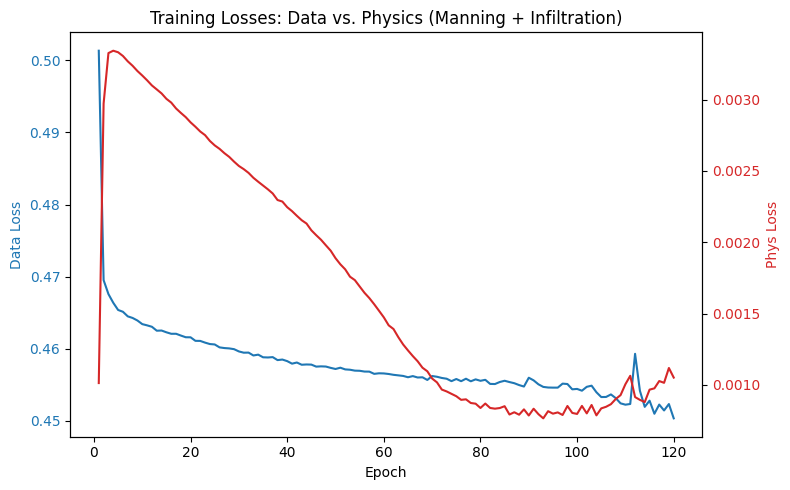


=== Evaluate with Matplotlib (lines) ===
[Matplotlib] Overall MSE: 1.7042


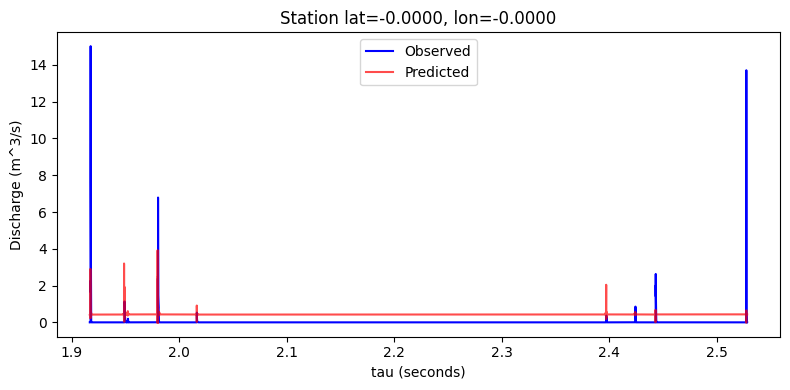


=== Evaluate with Plotly (lines) ===
[Plotly] Overall MSE: 1.7042


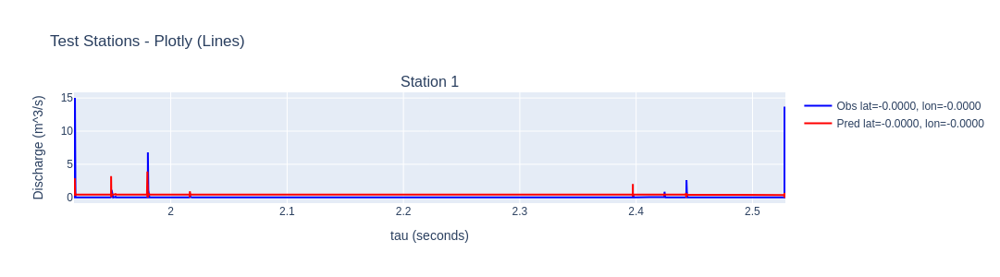


=== Evaluate with Plotly (lines + points, 2-row subplots) ===
[Plotly] Overall MSE: 1.7042


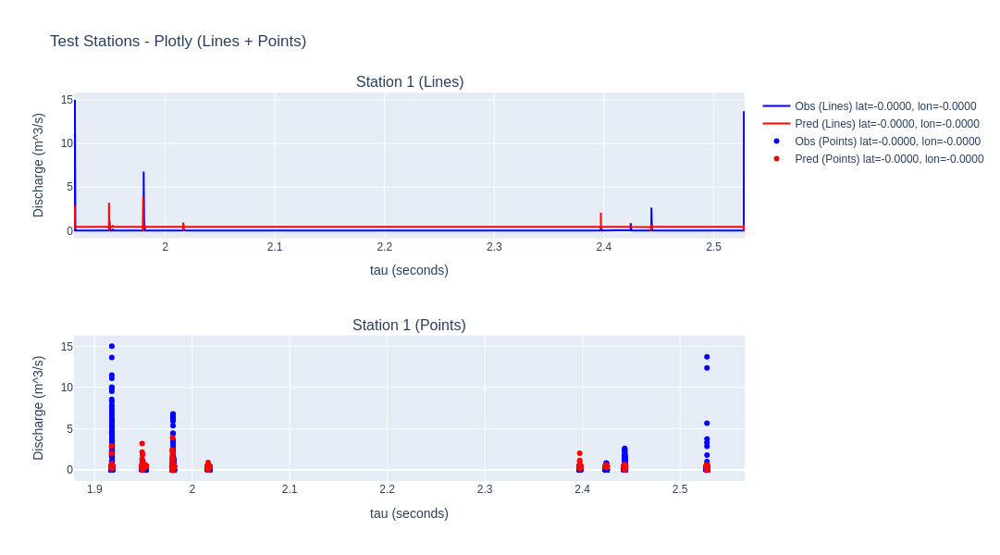

In [19]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

###############################################################################
# 1. File Paths & Hyperparameters
###############################################################################
DATA_DIR = (
    "/home/amit/work-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/FINAL/"
    "event_based/TIME_NORMALIZED"
)

TRAIN_FILES = [
    "darga_rain_2013_with_discharge_events.parquet",
    "darga_rain_2014_with_discharge_events.parquet",
    "darga_rain_2015_with_discharge_events.parquet",
    "darga_rain_2016_with_discharge_events.parquet",
    "darga_rain_2018_with_discharge_events.parquet",
]
TEST_FILES = [
    "darga_rain_2019_with_discharge_events.parquet",
    "darga_rain_2020_with_discharge_events.parquet",
]

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.2

BATCH_SIZE = 32
EPOCHS = 120
LR = 1e-4

# Weighted MSE emphasis on big flows
BETA_WEIGHT = 15.0
GLOBAL_QMAX = 60.0

# Physics loss coefficients
LAMBDA_DATA = 1.0
LAMBDA_PHYS = 0.8

# For the PDE time discretization
DELTA_T = 1.0

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

###############################################################################
# 2. Load & Merge Parquet
###############################################################################
def load_parquet_files(data_dir, file_list):
    merged_dfs = []
    for fname in file_list:
        fpath = os.path.join(data_dir, fname)
        if not os.path.exists(fpath):
            print(f"[WARNING] File not found: {fpath}")
            continue
        df_tmp = pd.read_parquet(fpath)
        merged_dfs.append(df_tmp)
    
    if not merged_dfs:
        raise ValueError("No valid Parquet files found. Check your paths/files.")
    
    df_merged = pd.concat(merged_dfs, ignore_index=True)
    return df_merged

###############################################################################
# 3. Basic Preprocessing
###############################################################################
def preprocess_dataframe(df):
    df = df[~df["rg_qms"].isna()].copy()
    df.sort_values("tau", ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

###############################################################################
# 4. Decide Which Columns to Use as Features
###############################################################################
def get_feature_columns(df):
    # Exclude columns not used or that are your target
    exclude_cols = {"EQUATION", "rg_qms", "time", "ID"}
    
    feature_cols = []
    for col in df.columns:
        if col not in exclude_cols:
            feature_cols.append(col)
    return feature_cols

###############################################################################
# 5. Sequence Dataset
###############################################################################
def make_sequences(df, feature_cols, seq_len=6):
    feats = df[feature_cols].values.astype(np.float32)
    discharge = df["rg_qms"].values.astype(np.float32)
    log_q = np.log1p(discharge)  # log(1+Q)
    
    tau_vals = df["tau"].values.astype(np.float32)
    lat_vals = df["latitude"].values.astype(np.float32)
    lon_vals = df["longitude"].values.astype(np.float32)
    
    X_list, y_list = [], []
    tau_list, lat_list, lon_list = [], [], []
    N = len(df)
    
    for i in range(N - seq_len):
        X_list.append(feats[i : i+seq_len])
        y_list.append(log_q[i + seq_len])  # final step as target
        tau_list.append(tau_vals[i + seq_len])
        lat_list.append(lat_vals[i + seq_len])
        lon_list.append(lon_vals[i + seq_len])
    
    X_all  = np.array(X_list, dtype=np.float32)
    y_all  = np.array(y_list, dtype=np.float32).reshape(-1,1)
    tau_all= np.array(tau_list, dtype=np.float32).reshape(-1,1)
    lat_all= np.array(lat_list, dtype=np.float32).reshape(-1,1)
    lon_all= np.array(lon_list, dtype=np.float32).reshape(-1,1)
    
    return X_all, y_all, tau_all, lat_all, lon_all

class DischargeDataset(Dataset):
    def __init__(self, X, y, tau, lat, lon):
        super().__init__()
        self.X = X
        self.y = y
        self.tau = tau
        self.lat = lat
        self.lon = lon
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return (
            self.X[idx],
            self.y[idx],
            self.tau[idx],
            self.lat[idx],
            self.lon[idx]
        )

###############################################################################
# 6. Model: LSTM + Infiltration + Manning-based PDE
###############################################################################
class LSTMFullPhysicsManning(nn.Module):
    """
    Incorporates multiple columns:
      - infiltration can depend on SLOPE, AREA_2M, ROUGHNESS, etc.
      - friction depends on manning_n, slope, and Q.

    PDE (single station, time only):
      Q_{t+1} - Q_t - DELTA_T * [ AREA_2M_t*(rain_t - infiltration_t) - friction(Q_t) ] = 0

    infiltration = ReLU( i0 + iArea*log(1+AREA_2M) + iSlope*SLOPE + iRough*ROUGHNESS + ... )
    friction(Q)  = alphaF * (1/manning_n) * sqrt(SLOPE) * Q
    """
    def __init__(
        self,
        input_size,
        idx_rain,
        idx_area,
        idx_slope,
        idx_manning,
        idx_rough,
        idx_dem=None,  # optional
        hidden_size=128,
        num_layers=2,
        dropout=0.2
    ):
        super().__init__()
        
        # LSTM
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Linear(hidden_size, 1)  # outputs log(Q)
        
        # infiltration parameters
        # You can add more if you like, e.g., iDEM, iAspect, etc.
        self.i0     = nn.Parameter(torch.tensor(0.1,  dtype=torch.float32))
        self.iArea  = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iSlope = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        self.iRough = nn.Parameter(torch.tensor(0.0,  dtype=torch.float32))
        
        # If you want infiltration to also depend on DEM or other columns,
        # just define more parameters: self.iDEM = ...
        
        # friction parameter
        self.alphaF = nn.Parameter(torch.tensor(0.01, dtype=torch.float32))
        
        # store indices
        self.idx_rain    = idx_rain
        self.idx_area    = idx_area
        self.idx_slope   = idx_slope
        self.idx_manning = idx_manning
        self.idx_rough   = idx_rough
        self.idx_dem     = idx_dem  # optional
        
        self.relu = nn.ReLU()
    
    def forward(self, x, return_sequences=False):
        """
        x shape: (batch, seq_len, input_size)
        Return log(Q) for each time-step if return_sequences=True,
        else only the last time-step.
        """
        lstm_out, (h_n, c_n) = self.lstm(x)
        log_q_seq = self.fc(lstm_out)  # shape => (batch, seq_len, 1)
        
        if return_sequences:
            return log_q_seq
        else:
            return log_q_seq[:, -1, :]  # (batch, 1)

    def infiltration_fn(self, area_val, slope_val, rough_val):
        """
        infiltration = ReLU( i0 + iArea*log(1+area) + iSlope*slope + iRough*rough )
        You can add more terms if you want (DEM, aspect, etc.).
        """
        # log(1+area) helps scale large area_2m
        area_log = torch.log1p(area_val)
        raw_infil = (self.i0
                     + self.iArea  * area_log
                     + self.iSlope * slope_val
                     + self.iRough * rough_val)
        return self.relu(raw_infil)
    
    def friction_fn(self, Q_t, manning_val, slope_val):
        """
        friction = alphaF * (1 / manning_val) * sqrt(slope_val) * Q_t
        """
        # guard against zero manning
        manning_safe = manning_val + 1e-6
        friction_val = self.alphaF * (1.0 / manning_safe) * torch.sqrt(slope_val) * Q_t
        return friction_val

###############################################################################
# 7. Loss Functions
###############################################################################
def weighted_mse_loss(log_q_pred, log_q_true, beta=15.0, global_qmax=60.0):
    Q_true = torch.expm1(log_q_true)
    w = 1.0 + beta * (Q_true / global_qmax)
    diff = (log_q_pred - log_q_true)**2
    return torch.mean(w * diff)

def compute_manning_pde_residual(
    model: LSTMFullPhysicsManning,
    X_batch: torch.Tensor,
    log_q_seq: torch.Tensor
):
    """
    PDE (single station):
      Q_{t+1} - Q_t - DELTA_T*[ area*(rain-infil) - friction(Q_t) ] = 0
      
      infiltration = infiltration_fn(...)
      friction = friction_fn(Q_t, manning, slope)

    X_batch shape: (batch, seq_len, input_size)
    log_q_seq shape: (batch, seq_len, 1)
    """
    Q_seq = torch.expm1(log_q_seq)  # actual discharge (batch, seq_len, 1)
    batch_size, seq_len, _ = log_q_seq.shape
    
    # PDE residual accum
    penalty = 0.0
    
    for t in range(seq_len - 1):
        Q_t   = Q_seq[:, t, 0]     # shape (batch,)
        Q_tp1 = Q_seq[:, t+1, 0]
        
        # parse from X_batch
        rain_t  = X_batch[:, t, model.idx_rain]      # shape (batch,)
        area_t  = X_batch[:, t, model.idx_area]
        slope_t = X_batch[:, t, model.idx_slope]
        manning_t = X_batch[:, t, model.idx_manning]
        rough_t   = X_batch[:, t, model.idx_rough]
        
        # infiltration
        infil_t = model.infiltration_fn(area_t, slope_t, rough_t)  # shape (batch,)
        eff_rain = rain_t - infil_t
        eff_rain = torch.clamp(eff_rain, min=0.0)
        
        # friction
        fric_t = model.friction_fn(Q_t, manning_t, slope_t)  # shape (batch,)
        
        # PDE residual
        # (Q_{t+1} - Q_t) - DELTA_T*( area_t*eff_rain - fric_t )
        resid_t = (Q_tp1 - Q_t) - DELTA_T*( area_t * eff_rain - fric_t )
        penalty += torch.mean(resid_t**2)
    
    if seq_len > 1:
        penalty = penalty / (seq_len - 1)
    return penalty

###############################################################################
# 8. Training Loop
###############################################################################
def train_model(
    model,
    train_loader,
    optimizer,
    num_epochs=120,
    lambda_data=1.0,
    lambda_phys=0.8,
    beta_weight=15.0,
    global_qmax=60.0
):
    data_losses = []
    phys_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_data_loss = 0.0
        epoch_phys_loss = 0.0
        n_batches = 0
        
        for X_batch, y_log_batch, _, _, _ in train_loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            optimizer.zero_grad()
            
            # Get log(Q) for each time-step
            log_q_seq = model(X_batch, return_sequences=True)  # (batch, seq_len, 1)
            
            # Data loss: compare last time-step
            log_q_pred_last = log_q_seq[:, -1, 0]  # (batch,)
            data_loss_val = weighted_mse_loss(
                log_q_pred_last, y_log_batch.flatten(),
                beta=beta_weight, global_qmax=global_qmax
            ) * lambda_data
            
            # Physics penalty
            phys_resid = compute_manning_pde_residual(model, X_batch, log_q_seq)
            phys_pen = phys_resid * lambda_phys
            
            total_loss = data_loss_val + phys_pen
            total_loss.backward()
            optimizer.step()
            
            epoch_data_loss += data_loss_val.item() / max(lambda_data, 1e-9)
            epoch_phys_loss += phys_pen.item() / max(lambda_phys, 1e-9)
            n_batches += 1
        
        if n_batches > 0:
            data_losses.append(epoch_data_loss / n_batches)
            phys_losses.append(epoch_phys_loss / n_batches)
        
        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"- DataLoss: {data_losses[-1]:.4f}, PhysLoss: {phys_losses[-1]:.4f}")
    
    return data_losses, phys_losses

###############################################################################
# 9. Plotting & Evaluation
###############################################################################
def plot_training_losses(data_losses, phys_losses):
    epochs = range(1, len(data_losses)+1)
    fig, ax1 = plt.subplots(figsize=(8,5))
    
    color_data = 'tab:blue'
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Data Loss", color=color_data)
    ax1.plot(epochs, data_losses, color=color_data)
    ax1.tick_params(axis='y', labelcolor=color_data)
    
    ax2 = ax1.twinx()
    color_phys = 'tab:red'
    ax2.set_ylabel("Phys Loss", color=color_phys)
    ax2.plot(epochs, phys_losses, color=color_phys)
    ax2.tick_params(axis='y', labelcolor=color_phys)
    
    plt.title("Training Losses: Data vs. Physics (Manning + Infiltration)")
    plt.tight_layout()
    plt.show()

def evaluate_per_station_matplotlib(model, loader):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch, return_sequences=False)  # shape (batch, 1)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Matplotlib] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        plt.figure(figsize=(8,4))
        plt.plot(tau_st, obs_st, label="Observed", color='blue')
        plt.plot(tau_st, pred_st, label="Predicted", color='red', alpha=0.7)
        plt.xlabel("tau (seconds)")
        plt.ylabel("Discharge (m^3/s)")
        plt.title(f"Station lat={lat_st:.4f}, lon={lon_st:.4f}")
        plt.legend()
        plt.tight_layout()
        plt.show()

def evaluate_per_station_plotly(model, loader, title="Test Stations - Plotly (Lines)"):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch, return_sequences=False)
            q_pred  = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true  = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np  = tau_batch.cpu().numpy().flatten()
            lat_np  = lat_batch.numpy().flatten()
            lon_np  = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    station_coords = {}
    for (lat, lon) in zip(all_lat, all_lon):
        station_coords[(lat, lon)] = True
    unique_stations = list(station_coords.keys())
    n_stations = len(unique_stations)
    
    fig = make_subplots(
        rows=n_stations, cols=1,
        subplot_titles=[f"Station {i+1}" for i in range(n_stations)]
    )
    
    row_idx = 1
    for st in unique_stations:
        lat_st, lon_st = st
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        
        tau_st = all_tau[mask]
        obs_st = all_truth[mask]
        pred_st= all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st = tau_st[idx_sort]
        obs_st = obs_st[idx_sort]
        pred_st= pred_st[idx_sort]
        
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st, 
                mode='lines', 
                name=f"Obs lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_idx, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_idx, col=1
        )
        
        row_idx += 1
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * n_stations
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    fig.show()

def evaluate_per_station_plotly_with_points(model, loader, title="Test Stations - Plotly (Lines + Points)"):
    model.eval()
    all_preds, all_truth = [], []
    all_tau, all_lat, all_lon = [], [], []
    
    with torch.no_grad():
        for X_batch, y_log_batch, tau_batch, lat_batch, lon_batch in loader:
            X_batch = X_batch.to(device)
            y_log_batch = y_log_batch.to(device)
            
            log_q_pred = model(X_batch, return_sequences=False)
            q_pred = torch.expm1(log_q_pred).cpu().numpy().flatten()
            q_true = torch.expm1(y_log_batch).cpu().numpy().flatten()
            
            tau_np = tau_batch.cpu().numpy().flatten()
            lat_np = lat_batch.numpy().flatten()
            lon_np = lon_batch.numpy().flatten()
            
            all_preds.append(q_pred)
            all_truth.append(q_true)
            all_tau.append(tau_np)
            all_lat.append(lat_np)
            all_lon.append(lon_np)
    
    all_preds = np.concatenate(all_preds)
    all_truth = np.concatenate(all_truth)
    all_tau   = np.concatenate(all_tau)
    all_lat   = np.concatenate(all_lat)
    all_lon   = np.concatenate(all_lon)
    
    val_mse = np.mean((all_preds - all_truth)**2)
    print(f"[Plotly] Overall MSE: {val_mse:.4f}")
    
    unique_coords = list(set(zip(all_lat, all_lon)))
    n_stations = len(unique_coords)
    
    total_rows = 2 * n_stations
    subplot_titles = []
    for i in range(n_stations):
        subplot_titles.append(f"Station {i+1} (Lines)")
        subplot_titles.append(f"Station {i+1} (Points)")
    
    fig = make_subplots(
        rows=total_rows, cols=1,
        subplot_titles=subplot_titles
    )
    
    unique_coords.sort(key=lambda x: (x[0], x[1]))
    
    for i, (lat_st, lon_st) in enumerate(unique_coords, start=1):
        mask = (all_lat == lat_st) & (all_lon == lon_st)
        tau_st  = all_tau[mask]
        obs_st  = all_truth[mask]
        pred_st = all_preds[mask]
        
        idx_sort = np.argsort(tau_st)
        tau_st  = tau_st[idx_sort]
        obs_st  = obs_st[idx_sort]
        pred_st = pred_st[idx_sort]
        
        row_lines = 2*i - 1
        row_points = 2*i
        
        # (A) Lines subplot
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='lines',
                name=f"Obs (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='blue')
            ),
            row=row_lines, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='lines',
                name=f"Pred (Lines) lat={lat_st:.4f}, lon={lon_st:.4f}",
                line=dict(color='red')
            ),
            row=row_lines, col=1
        )
        
        # (B) Points subplot
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=obs_st,
                mode='markers',
                name=f"Obs (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='blue', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=tau_st, y=pred_st,
                mode='markers',
                name=f"Pred (Points) lat={lat_st:.4f}, lon={lon_st:.4f}",
                marker=dict(color='red', size=6, symbol='circle')
            ),
            row=row_points, col=1
        )
    
    fig.update_layout(
        title=title,
        hovermode='x',
        showlegend=True,
        height=300 * total_rows
    )
    fig.update_xaxes(title_text='tau (seconds)')
    fig.update_yaxes(title_text='Discharge (m^3/s)')
    fig.show()

###############################################################################
# 10. Main
###############################################################################
def main():
    # 1) Load Training Data
    df_train = load_parquet_files(DATA_DIR, TRAIN_FILES)
    df_train = preprocess_dataframe(df_train)
    print("Train shape:", df_train.shape)
    
    # 2) Load Test Data
    df_test = load_parquet_files(DATA_DIR, TEST_FILES)
    df_test = preprocess_dataframe(df_test)
    print("Test shape:", df_test.shape)
    
    # 3) Build feature_cols from df_train
    feature_cols = get_feature_columns(df_train)
    print("All feature columns used:", feature_cols)
    
    # 4) Fit & Apply Scaler
    scaler = StandardScaler()
    scaler.fit(df_train[feature_cols])
    df_train[feature_cols] = scaler.transform(df_train[feature_cols])
    df_test[feature_cols]  = scaler.transform(df_test[feature_cols])
    
    # 5) Convert to sequences
    seq_len = 6
    X_train, y_train, tau_train, lat_train, lon_train = make_sequences(df_train, feature_cols, seq_len)
    X_test,  y_test,  tau_test,  lat_test,  lon_test  = make_sequences(df_test,  feature_cols, seq_len)
    
    train_ds = DischargeDataset(X_train, y_train, tau_train, lat_train, lon_train)
    test_ds  = DischargeDataset(X_test,  y_test,  tau_test,  lat_test,  lon_test)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)
    
    print("Train sequences:", len(train_ds), "Test sequences:", len(test_ds))
    num_features = len(feature_cols)
    
    # 6) Identify column indices for PDE
    # Adjust if your actual column names differ
    idx_rain    = feature_cols.index("rainrate")
    idx_area    = feature_cols.index("AREA_2M")     # your area column
    idx_slope   = feature_cols.index("SLOPE")
    idx_manning = feature_cols.index("manning_n")   # if you have manning_n
    idx_rough   = feature_cols.index("ROUGHNESS")   # if you want to use roughness in infiltration
    
    # 7) Instantiate Model
    model = LSTMFullPhysicsManning(
        input_size=num_features,
        idx_rain=idx_rain,
        idx_area=idx_area,
        idx_slope=idx_slope,
        idx_manning=idx_manning,
        idx_rough=idx_rough,
        hidden_size=HIDDEN_SIZE,
        num_layers=NUM_LAYERS,
        dropout=DROPOUT
    ).to(device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    
    # 8) Train
    print(f"\n=== Training for {EPOCHS} epochs with {num_features} input features ===")
    data_losses, phys_losses = train_model(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        num_epochs=EPOCHS,
        lambda_data=LAMBDA_DATA,
        lambda_phys=LAMBDA_PHYS,
        beta_weight=BETA_WEIGHT,
        global_qmax=GLOBAL_QMAX
    )
    
    # 9) Plot Training Losses
    plot_training_losses(data_losses, phys_losses)
    
    # 10) Evaluate on Test Set
    print("\n=== Evaluate with Matplotlib (lines) ===")
    evaluate_per_station_matplotlib(model, test_loader)
    
    print("\n=== Evaluate with Plotly (lines) ===")
    evaluate_per_station_plotly(model, test_loader, title="Test Stations - Plotly (Lines)")
    
    print("\n=== Evaluate with Plotly (lines + points, 2-row subplots) ===")
    evaluate_per_station_plotly_with_points(model, test_loader, title="Test Stations - Plotly (Lines + Points)")

if __name__ == "__main__":
    main()


In [12]:
#THIRED RUN - changing the LOSS and improve it (curicullum learning)

In [ ]:
#THIRED AND HALF RUN - XPINN - one nn for the all domein

In [ ]:
#FORTH RUN - try nvidia-phsicisNeMo

In [ ]:
# FIFTH RUN - can try spatial embbeding

In [ ]:
# go back to my notes in the pages